In [ ]:
%matplotlib inline
import arviz as az # v 0.15.1
import matplotlib.pyplot as plt # v 3.7.1
from sklearn.metrics import mean_squared_error # v 1.2.2
import numpy as np # v 1.23.5
import pymc as pm # v 5.7.2
from scipy import stats # v 1.11.4
from scipy.special import erf # 1.11.4
import pandas as pd # v 1.5.3
import seaborn as sns # v 0.12.2
from sklearn.preprocessing import StandardScaler # v 1.2.2
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay, accuracy_score, auc, roc_curve

In [ ]:
az.style.use('arviz-darkgrid')
random_seed = 12345

## Data Importing and Cleaning

We read in the dataframe.

In [ ]:
fires = pd.read_csv('Algerian_forest_fires_dataset_UPDATE.csv', skiprows=1)

We rename the columns to remove whitespace.

In [ ]:
fires.rename(columns = {"Rain ":"Rain", " RH":"RH", " Ws":"Ws", "Classes  ": "Classes"}, inplace=True)

The two tables of the two regions were provided in two tables in a single CSV file. The below code identifies which row was the split between the two regions within the dataset.

In [ ]:
fires.iloc[122:124,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes


We create region based on which regional dataset each row was in and add a dummy variable 1 if "Bejaia" and 0 if "Sidi-Bel".

In [ ]:
fires['region'] = ["Bejaia" if x < 124 else "Sidi-Bel" for x in range(fires.shape[0])]

In [ ]:
fires['region_dummy'] = [0 if x < 124 else 1 for x in range(fires.shape[0])]

Here we drop the two rows in the dataset that correspond to the header in the CSV for the Sidi-Bel region. Additionally, we drop the year column as the entirety of observations in our data take place in 2012.

In [ ]:
fires.drop([122, 123], inplace=True)
fires.drop(['year'], axis=1, inplace=True)

We check the data type of each feature.

In [ ]:
fires.dtypes

day             object
month           object
Temperature     object
RH              object
Ws              object
Rain            object
FFMC            object
DMC             object
DC              object
ISI             object
BUI             object
FWI             object
Classes         object
region          object
region_dummy     int64
dtype: object

We create a list of the numeric columns and then convert them into type 'numeric'. For Class we made it a 'categorical' variable.

In [ ]:
numeric_columns = ['day', 'month', 'Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'FWI']
fires[numeric_columns] = fires[numeric_columns].apply(pd.to_numeric, errors='coerce')

fires['Classes'] = fires['Classes'].astype('category')

We noticed one of the rows had an issue were the CSV was loaded without the deliniating ',' for one observation. We manually code in these values to represent the observation correctly.

In [ ]:
fires.loc[167, 'DMC'] = 12.9
fires.loc[167, 'DC'] = 14.6
fires.loc[167, 'ISI'] = 9
fires.loc[167, 'BUI'] = 12.5
fires.loc[167, 'FWI'] = 10.4
fires.loc[167, 'Classes'] = 'fire'

In [ ]:
fires.loc[167]

day                   14
month                  7
Temperature           37
RH                    37
Ws                    18
Rain                 0.2
FFMC                88.9
DMC                 12.9
DC                  14.6
ISI                  9.0
BUI                 12.5
FWI                 10.4
Classes             fire
region          Sidi-Bel
region_dummy           1
Name: 167, dtype: object

We checked Classes to ensure it was the binary outcome we expected and we see there is some whitespace which prevents it from being a binary class.

In [ ]:
fires['Classes'].unique()

['not fire   ', 'fire   ', 'fire', 'fire ', 'not fire', 'not fire ', 'not fire     ', 'not fire    ']
Categories (8, object): ['fire', 'fire ', 'fire   ', 'not fire', 'not fire ', 'not fire   ',
                         'not fire    ', 'not fire     ']

We remove the whitespace to make the class binary, and then code a dummy variable.

In [ ]:
fires['Classes'] = fires['Classes'].str.replace(' ', '')

In [ ]:
fires['Classes_binary'] = np.where(fires['Classes'] == 'fire', 1, 0)

## EDA

Below we get a high level description of each field.

In [ ]:
fires.describe(include='all')

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,region,region_dummy,Classes_binary
count,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244,244,244.000000,244.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fire,Bejaia,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,138,122,NaN,NaN
mean,15.754098,7.500000,32.172131,61.938525,15.504098,0.760656,77.887705,14.673361,49.288115,4.759836,16.673361,7.049180,NaN,NaN,0.500000,0.565574
std,8.825059,1.112961,3.633843,14.884200,2.810178,1.999406,14.337571,12.368039,47.619662,4.154628,14.201648,7.428366,NaN,NaN,0.501028,0.496700
min,1.000000,6.000000,22.000000,21.000000,6.000000,0.000000,28.600000,0.700000,6.900000,0.000000,1.100000,0.000000,NaN,NaN,0.000000,0.000000
25%,8.000000,7.000000,30.000000,52.000000,14.000000,0.000000,72.075000,5.800000,13.275000,1.400000,6.000000,0.700000,NaN,NaN,0.000000,0.000000
50%,16.000000,7.500000,32.000000,63.000000,15.000000,0.000000,83.500000,11.300000,33.100000,3.500000,12.450000,4.450000,NaN,NaN,0.500000,1.000000
75%,23.000000,8.000000,35.000000,73.250000,17.000000,0.500000,88.300000,20.750000,68.150000,7.300000,22.525000,11.375000,NaN,NaN,1.000000,1.000000


Below is the correlation matrix for the features and a heatmap of the correlations. We see there are a number of features that are highly correlated. This makes sense given all the features are some combination of the four weather predictors Wind, Temperature, Relative Humidity, Wind Speed.

In [ ]:
corr = fires.corr().round(3)
corr

<ipython-input-17-19beb688faf4>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = fires.corr().round(3)


,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,region_dummy,Classes_binary
day,1.000,0.000,0.096,-0.074,0.047,-0.112,0.224,0.492,0.528,0.179,0.517,0.350,0.000,0.202
month,0.000,1.000,-0.059,-0.038,-0.041,0.035,0.016,0.068,0.128,0.064,0.086,0.082,-0.000,0.022
Temperature,0.096,-0.059,1.000,-0.654,-0.278,-0.327,0.677,0.483,0.370,0.606,0.456,0.567,0.273,0.518
RH,-0.074,-0.038,-0.654,1.000,0.236,0.223,-0.646,-0.405,-0.220,-0.688,-0.350,-0.580,-0.406,-0.435
Ws,0.047,-0.041,-0.278,0.236,1.000,0.170,-0.163,-0.001,0.076,0.012,0.030,0.034,-0.177,-0.067
Rain,-0.112,0.035,-0.327,0.223,0.170,1.000,-0.544,-0.289,-0.297,-0.348,-0.299,-0.325,-0.041,-0.379
FFMC,0.224,0.016,0.677,-0.646,-0.163,-0.544,1.000,0.602,0.504,0.741,0.590,0.691,0.225,0.770
DMC,0.492,0.068,0.483,-0.405,-0.001,-0.289,0.602,1.000,0.875,0.678,0.982,0.875,0.191,0.584
DC,0.528,0.128,0.370,-0.220,0.076,-0.297,0.504,0.875,1.000,0.504,0.942,0.737,-0.081,0.507
ISI,0.179,0.064,0.606,-0.688,0.012,-0.348,0.741,0.678,0.504,1.000,0.641,0.922,0.266,0.736


<Axes: >

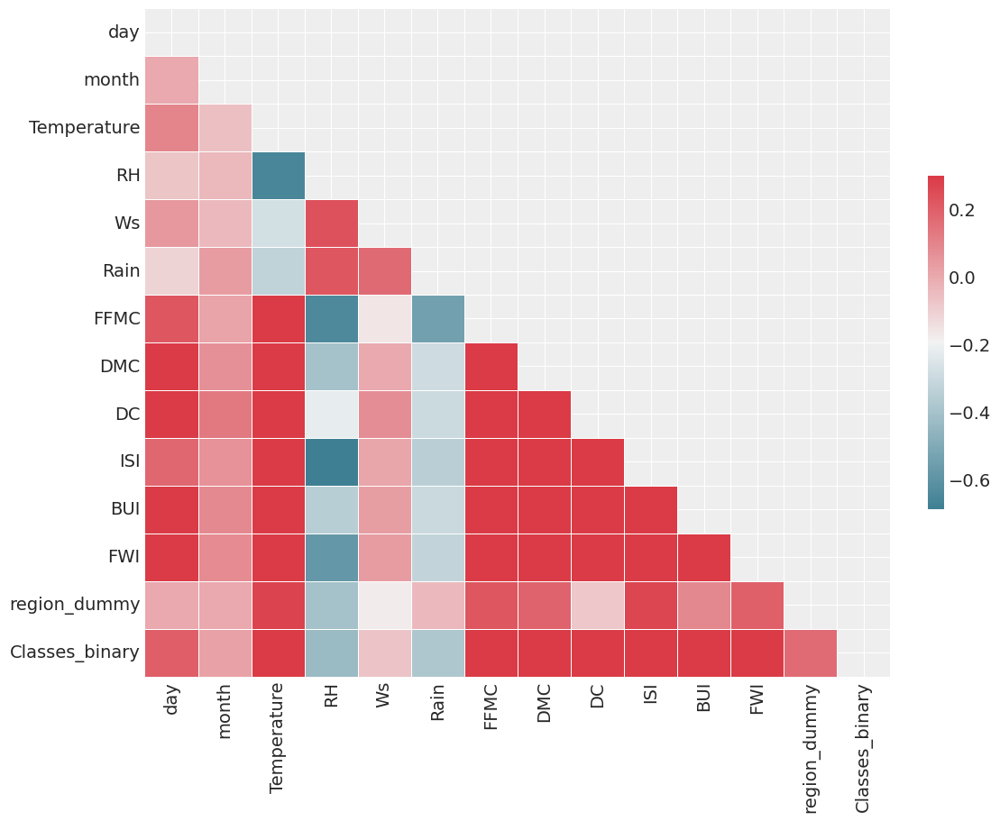

In [ ]:
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(
corr,
mask=mask,
cmap=cmap,
vmax=0.3,
linewidths=0.5,
cbar_kws={"shrink": 0.5},
ax=ax,
)

Below we looked at the distribution of the features.

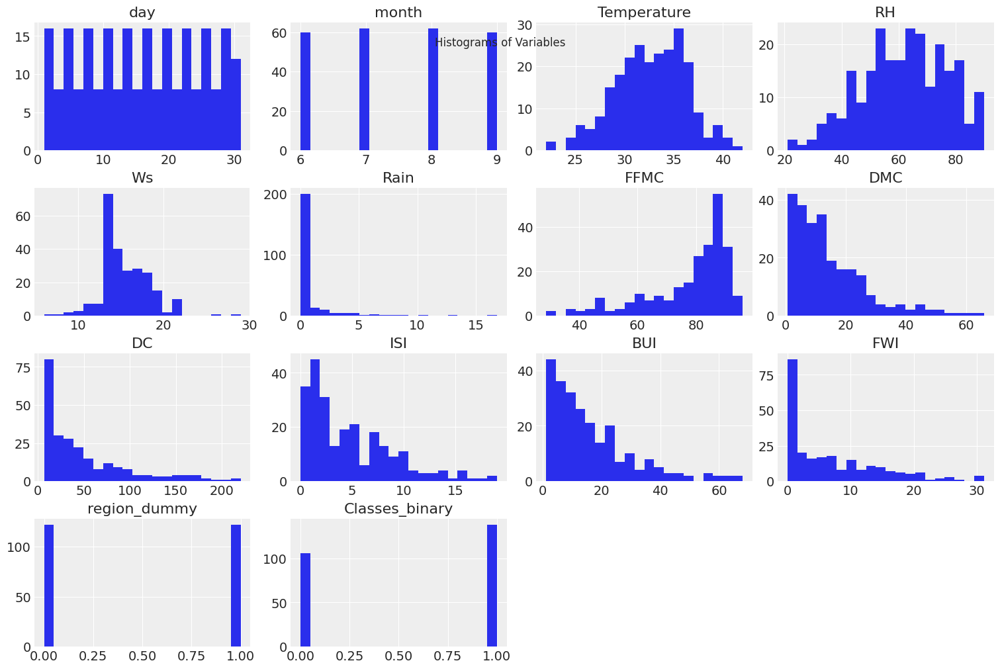

In [ ]:
fires.hist(bins=20, figsize=(15, 10))
plt.suptitle('Histograms of Variables', y=0.95)
plt.show()

Below is the pairplot showing the relation of the features with one another.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


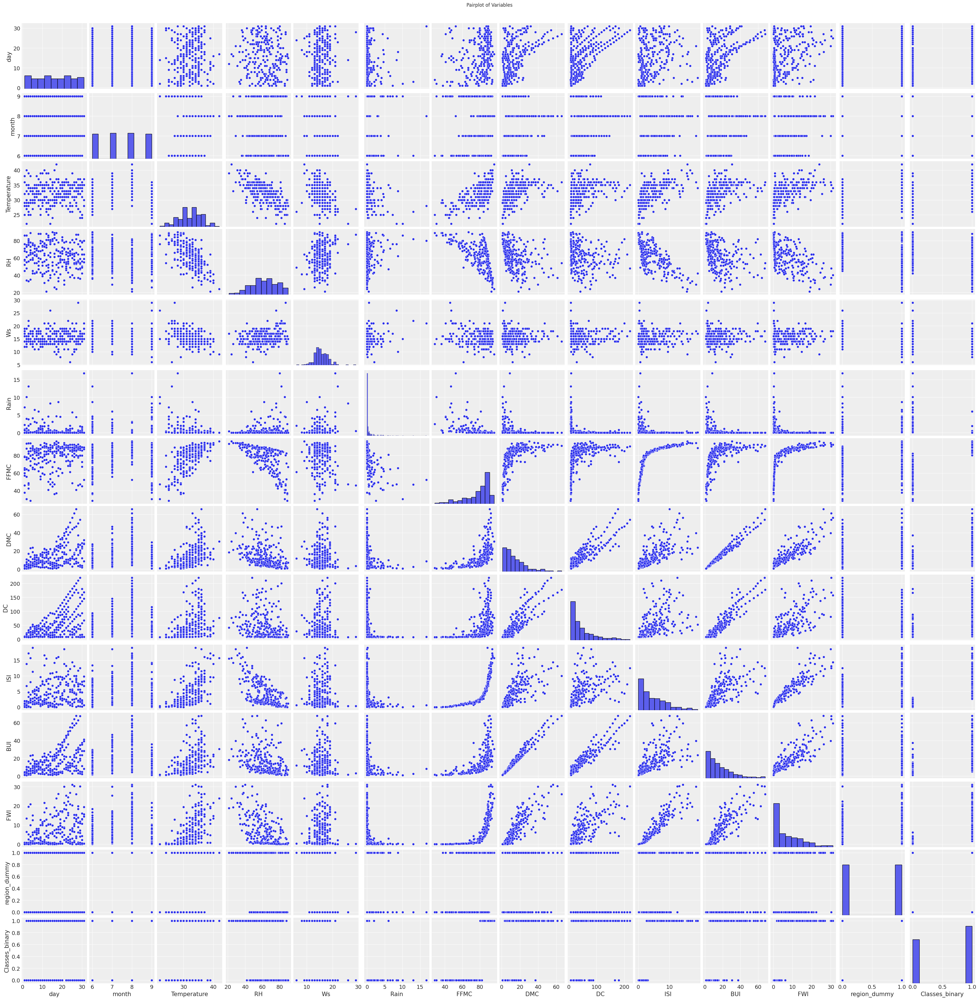

In [ ]:
sns.pairplot(fires, height=2.5)
plt.suptitle('Pairplot of Variables', y=1.02)
plt.show()

## Project

Approach: We propose to use a Bayesian logistic regression with No U-Turn Sampling and will investigate:



1. Identify which weather observations have an impact on the likelihood of a fire in Algeria and their relation to the likelihood of a fire

2. Identify if the weather observations have a different impact between the two regions: Sidi Bel-abbes and Bejaia

3. Attempt to build a model that predicts Fire likelihood better than FWI

# Preprocess Data for Modeling

Create the variables that we will use for building our models.

In [ ]:
num_regions = len(fires['region'].unique())
region_unique = fires['region'].unique()
fires['Rain_sqrt'] = np.sqrt(fires['Rain'])

In [ ]:
fires_train, fires_test = train_test_split(fires, test_size=0.2, stratify=fires['region'], random_state=random_seed)

In [ ]:
continuous_cols = ['Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'FWI','Rain_sqrt']
scaler = StandardScaler()
fires_train[continuous_cols] = scaler.fit_transform(fires_train[continuous_cols])

In [ ]:
Rain_sqrt = fires_train['Rain_sqrt'].values
month = fires_train['month'].values
Temperature = fires_train['Temperature'].values
RH = fires_train['RH'].values
Ws = fires_train['Ws'].values
Rain = fires_train['Rain'].values
FFMC = fires_train['FFMC'].values
DMC = fires_train['DMC'].values
DC = fires_train['DC'].values
ISI = fires_train['ISI'].values
BUI = fires_train['BUI'].values
FWI = fires_train['FWI'].values
region_ids = pd.Categorical(fires_train["region"]).codes
response_data = fires_train['Classes_binary'].values

# Fire Weather Observations and Relation to Likelihood of Fires

Below we created a model using the fire weather observation data to determine the realtion of each measurement to the likelihood of a fire starting in Algeria.

## Pooled Model

Given we standardized the data, we selected priors for our coefficents to be normal distributions centered around 0 and variance of 10 given this is relatively large for standardized data. We chose these priors because we are generally unfamilar with which fire weather conditions have what effect on fire likelihood so we decided to priors that bring very little information to the data.

We then build the model and generate the traces.

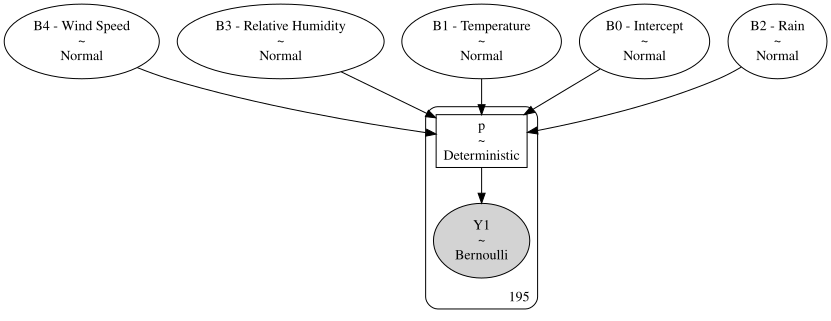

In [ ]:
with pm.Model() as measurement_model:
  B0 = pm.Normal('B0 - Intercept', mu = 0, sigma = 10)
  B1 = pm.Normal('B1 - Temperature', mu = 0, sigma = 10)
  B2 = pm.Normal('B2 - Rain', mu = 0, sigma = 10)
  B3 = pm.Normal('B3 - Relative Humidity', mu = 0, sigma = 10)
  B4 = pm.Normal('B4 - Wind Speed', mu = 0, sigma = 10)

  eta = B0 + B1 * Temperature + B2 * Rain + B3 * RH + B4 * Ws
  p = pm.Deterministic('p', pm.invlogit(eta))
  Y1 = pm.Bernoulli('Y1', p = p, observed = response_data)

pm.model_to_graphviz(measurement_model)

In [ ]:
graph = pm.model_to_graphviz(measurement_model)
#graph.render(filename='path/to/exported/graph2', format='png')

In [ ]:
with measurement_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    measurement_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


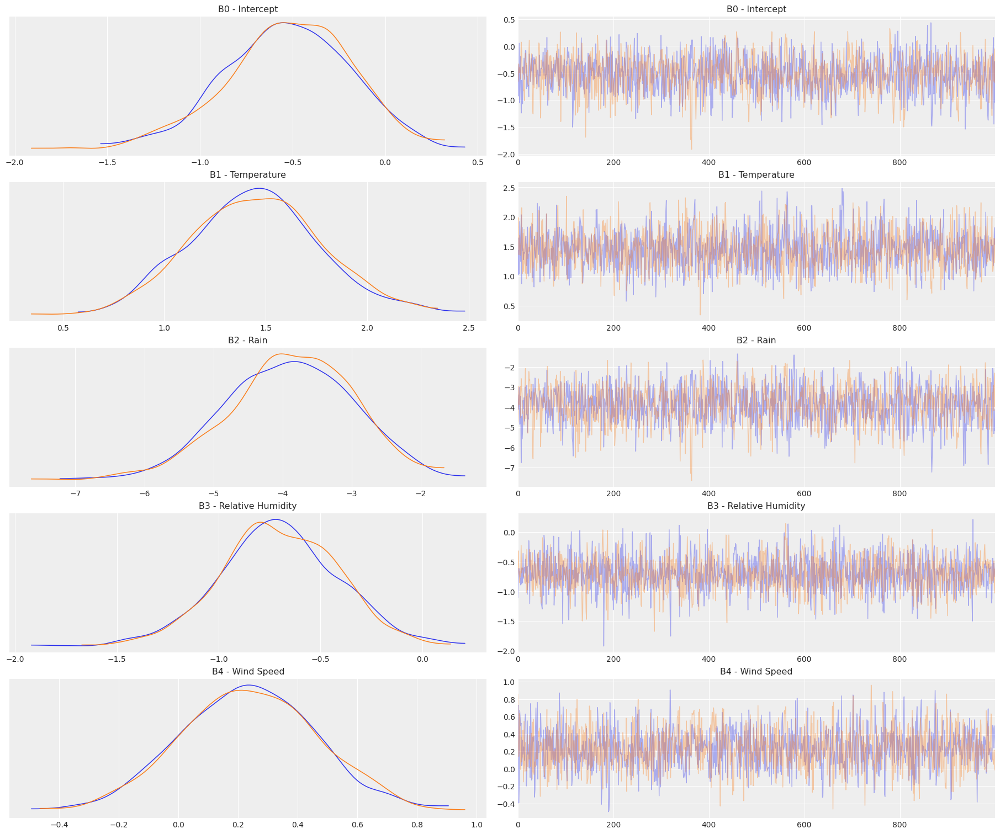

In [ ]:
az.plot_trace(measurement_trace, compact = False, var_names =['B0 - Intercept'
                                                              ,'B1 - Temperature'
                                                              ,'B2 - Rain'
                                                              ,'B3 - Relative Humidity'
                                                              ,'B4 - Wind Speed']
              , figsize = (18,15));

In [ ]:
az.summary(measurement_trace,  var_names =['B0 - Intercept'
                                            ,'B1 - Temperature'
                                            ,'B2 - Rain'
                                            ,'B3 - Relative Humidity'
                                            ,'B4 - Wind Speed'])

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept,-0.527,0.337,-1.186,0.089,0.009,0.007,1433.0,1322.0,1.0
B1 - Temperature,1.453,0.321,0.860,2.058,0.008,0.006,1805.0,1441.0,1.0
B2 - Rain,-3.895,0.927,-5.548,-2.121,0.025,0.018,1406.0,1404.0,1.0
B3 - Relative Humidity,-0.703,0.289,-1.245,-0.173,0.006,0.004,2180.0,1540.0,1.0
B4 - Wind Speed,0.234,0.230,-0.174,0.691,0.005,0.004,1936.0,1491.0,1.0


The R_hat values are 1.0 so the model converged and trace plots look good.

<Axes: title={'center': 'Y1 / Y1'}>

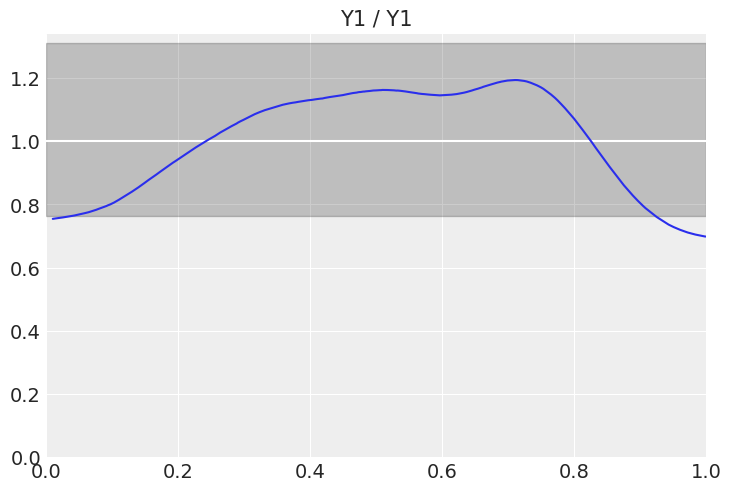

In [ ]:
measurement_pp = pm.sample_posterior_predictive(measurement_trace,
                                           model = measurement_model,
                                           random_seed = random_seed)
az.plot_bpv(measurement_pp)

<Axes: xlabel='Y1 / Y1'>

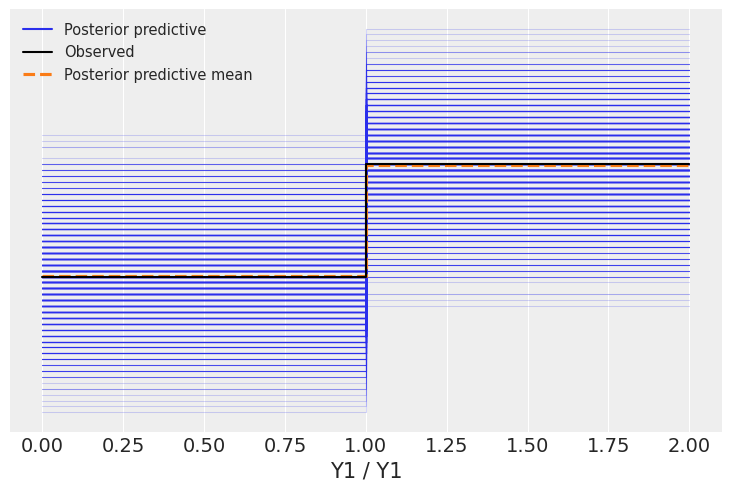

In [ ]:
az.plot_ppc(measurement_pp)

The postieror predictive checks look good. Our ppc has high variance likely because of the smaler dataset, but the posterior precitive mean looks relatively similar to the observed.

array([[<Axes: title={'center': 'B0 - Intercept'}>,
        <Axes: title={'center': 'B1 - Temperature'}>,
        <Axes: title={'center': 'B2 - Rain'}>],
       [<Axes: title={'center': 'B3 - Relative Humidity'}>,
        <Axes: title={'center': 'B4 - Wind Speed'}>, <Axes: >]],
      dtype=object)

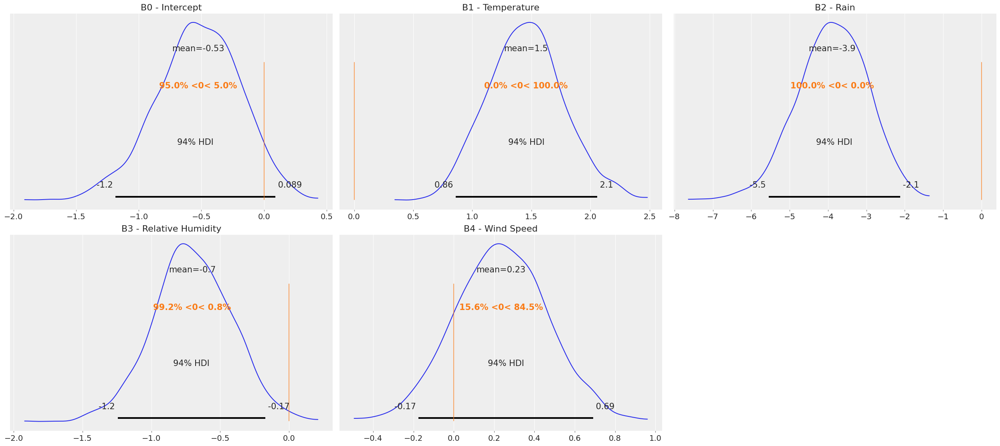

In [ ]:
az.plot_posterior(measurement_trace
                  , var_names =['B0 - Intercept'
                                ,'B1 - Temperature'
                                ,'B2 - Rain'
                                ,'B3 - Relative Humidity'
                                ,'B4 - Wind Speed']
                  , ref_val = 0,)

# Differences in Weather Observations between Bejaia and Sidi-Bel Abbes

## Unpooled

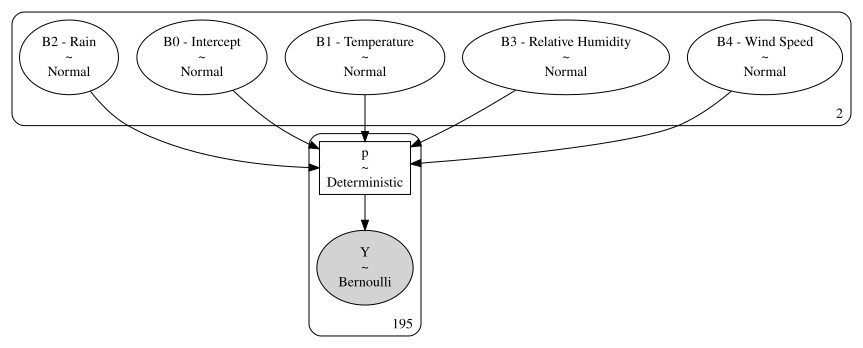

In [ ]:
with pm.Model() as unpooled_measurement_model:
    B0 = pm.Normal('B0 - Intercept', mu = 0, sigma = 10, shape=num_regions)
    B1 = pm.Normal('B1 - Temperature', mu = 0, sigma = 10, shape=num_regions)
    B2 = pm.Normal('B2 - Rain', mu = 0, sigma = 10, shape=num_regions)
    B3 = pm.Normal('B3 - Relative Humidity', mu = 0, sigma = 10, shape=num_regions)
    B4 = pm.Normal('B4 - Wind Speed', mu = 0, sigma = 10, shape=num_regions)

    eta = B0[region_ids] + B1[region_ids] * Temperature + B2[region_ids] * Rain + B3[region_ids] * RH + B4[region_ids] * Ws
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = response_data)

pm.model_to_graphviz(unpooled_measurement_model)

In [ ]:
graph = pm.model_to_graphviz(unpooled_measurement_model)
#graph.render(filename='path/to/exported/graph3', format='png')

In [ ]:
with unpooled_measurement_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    unpooled_measurement_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

In [ ]:
az.summary(unpooled_measurement_trace,  var_names =['B0 - Intercept'
                                                      ,'B1 - Temperature'
                                                      ,'B2 - Rain'
                                                      ,'B3 - Relative Humidity'
                                                      ,'B4 - Wind Speed'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept[0],-6.624,1.728,-9.799,-3.416,0.054,0.040,1113.0,916.0,1.00
B0 - Intercept[1],0.140,0.369,-0.550,0.809,0.009,0.007,1600.0,1553.0,1.00
B1 - Temperature[0],1.691,0.575,0.647,2.745,0.014,0.011,1621.0,1491.0,1.00
B1 - Temperature[1],1.757,0.481,0.815,2.601,0.015,0.011,1152.0,961.0,1.00
B2 - Rain[0],-20.105,4.675,-28.864,-11.420,0.150,0.112,1031.0,687.0,1.00
B2 - Rain[1],-2.874,0.885,-4.589,-1.378,0.026,0.021,1383.0,1020.0,1.00
B3 - Relative Humidity[0],-0.418,0.578,-1.523,0.626,0.014,0.011,1602.0,1298.0,1.00
B3 - Relative Humidity[1],-0.841,0.413,-1.682,-0.147,0.011,0.008,1574.0,1154.0,1.00
B4 - Wind Speed[0],0.212,0.383,-0.466,0.953,0.009,0.008,1963.0,1348.0,1.01
B4 - Wind Speed[1],0.617,0.362,-0.095,1.270,0.010,0.008,1423.0,1228.0,1.00


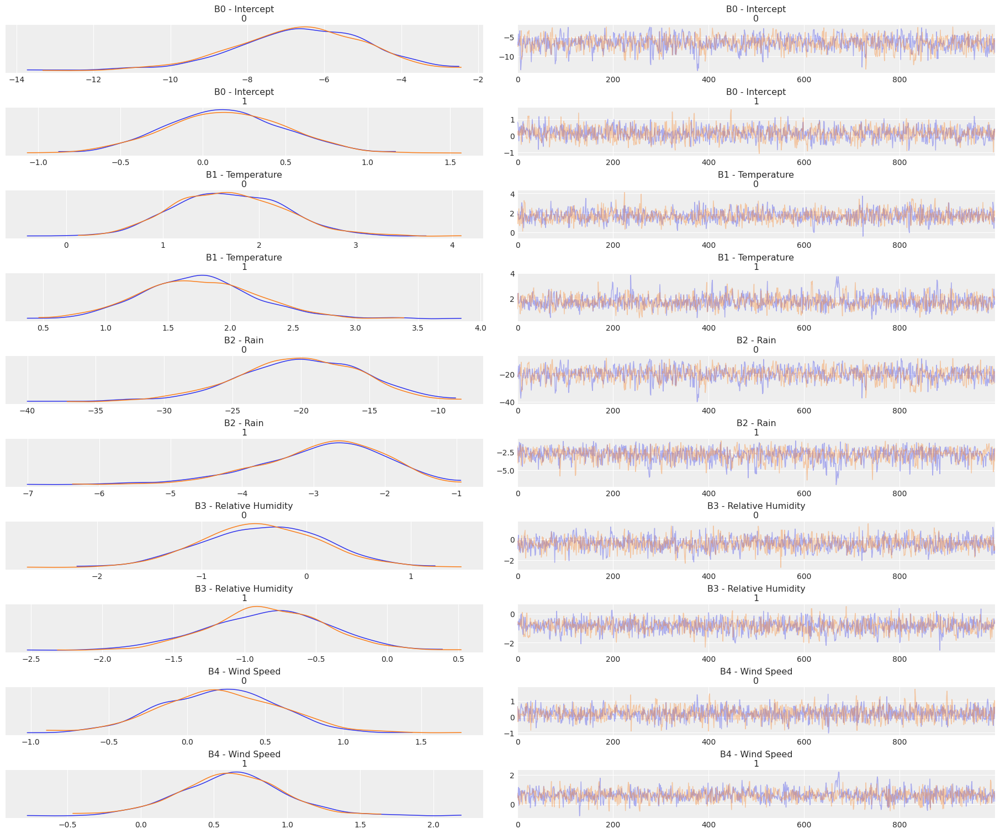

In [ ]:
az.plot_trace(unpooled_measurement_trace, compact = False, var_names =['B0 - Intercept'
                                                                      ,'B1 - Temperature'
                                                                      ,'B2 - Rain'
                                                                      ,'B3 - Relative Humidity'
                                                                      ,'B4 - Wind Speed'], figsize = (18,15));

<Axes: title={'center': 'Y / Y'}>

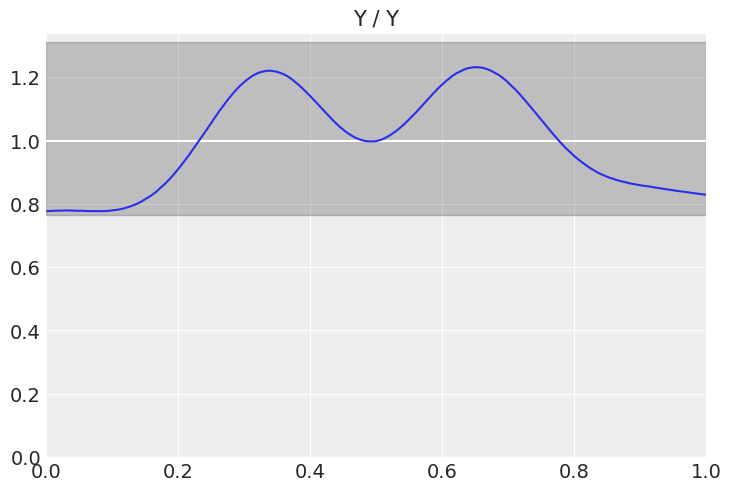

In [ ]:
unpooled_measurement_pp = pm.sample_posterior_predictive(unpooled_measurement_trace,
                                           model = unpooled_measurement_model,
                                           random_seed = random_seed)
az.plot_bpv(unpooled_measurement_pp)

<Axes: xlabel='Y / Y'>

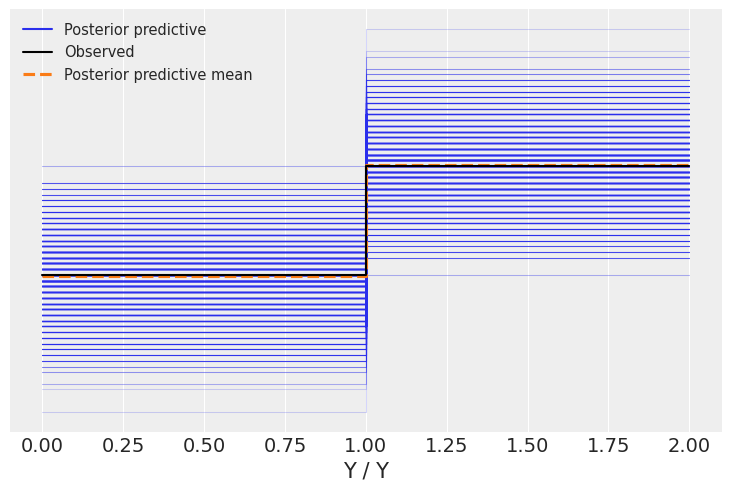

In [ ]:
az.plot_ppc(unpooled_measurement_pp)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

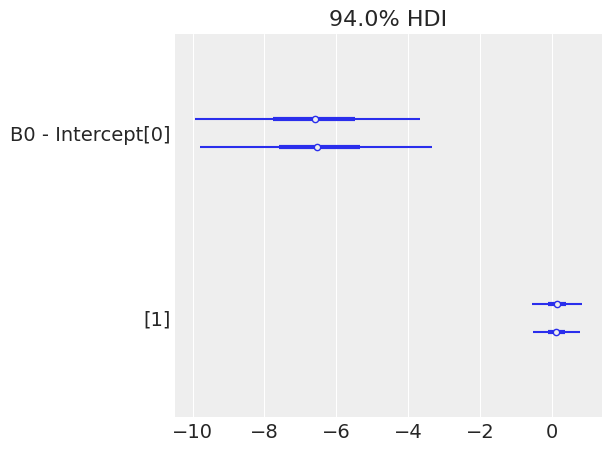

In [ ]:
az.plot_forest(unpooled_measurement_trace, var_names =['B0 - Intercept'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

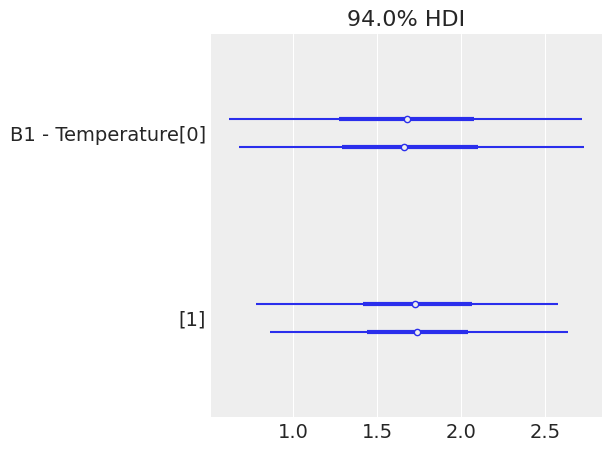

In [ ]:
az.plot_forest(unpooled_measurement_trace, var_names =['B1 - Temperature'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

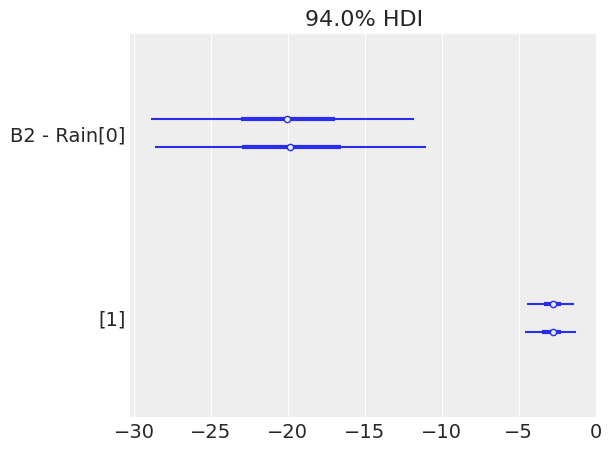

In [ ]:
az.plot_forest(unpooled_measurement_trace, var_names =['B2 - Rain'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

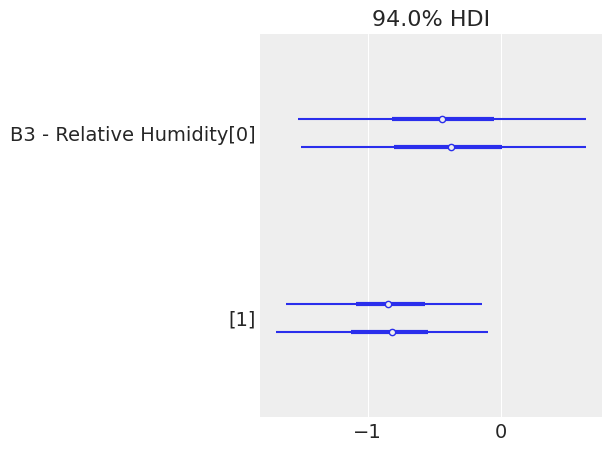

In [ ]:
az.plot_forest(unpooled_measurement_trace, var_names =['B3 - Relative Humidity'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

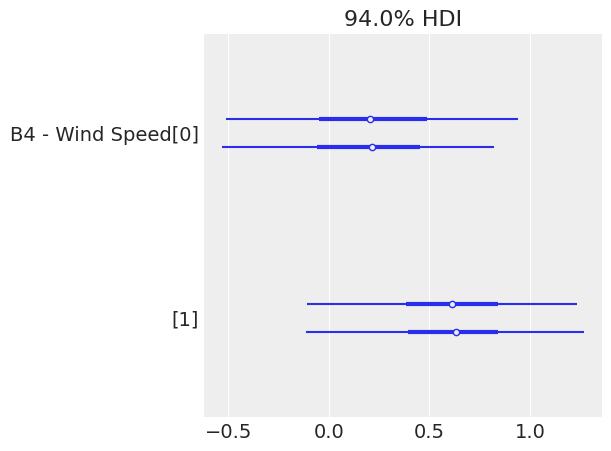

In [ ]:
az.plot_forest(unpooled_measurement_trace, var_names =['B4 - Wind Speed'],)

array([[<Axes: title={'center': 'B0 - Intercept\n0'}>,
        <Axes: title={'center': 'B0 - Intercept\n1'}>,
        <Axes: title={'center': 'B1 - Temperature\n0'}>],
       [<Axes: title={'center': 'B1 - Temperature\n1'}>,
        <Axes: title={'center': 'B2 - Rain\n0'}>,
        <Axes: title={'center': 'B2 - Rain\n1'}>],
       [<Axes: title={'center': 'B3 - Relative Humidity\n0'}>,
        <Axes: title={'center': 'B3 - Relative Humidity\n1'}>,
        <Axes: title={'center': 'B4 - Wind Speed\n0'}>],
       [<Axes: title={'center': 'B4 - Wind Speed\n1'}>, <Axes: >,
        <Axes: >]], dtype=object)

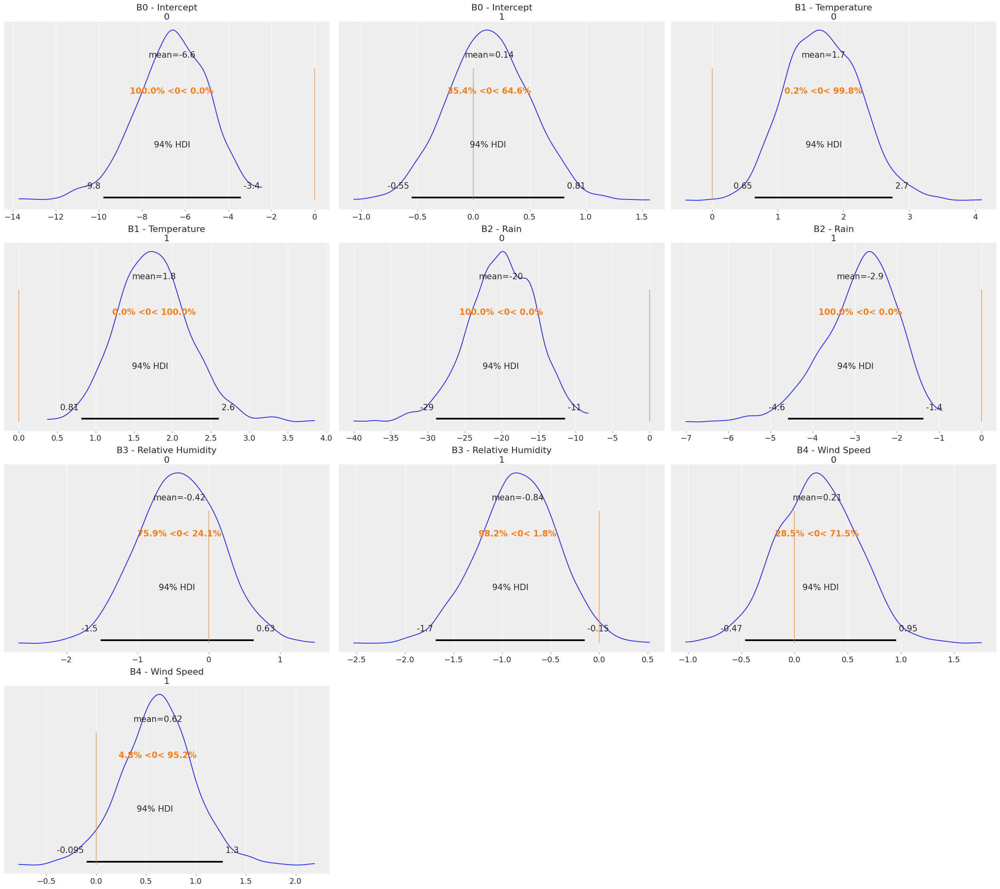

In [111]:
az.plot_posterior(unpooled_measurement_trace
                  , var_names =['B0 - Intercept'
                                ,'B1 - Temperature'
                                ,'B2 - Rain'
                                ,'B3 - Relative Humidity'
                                ,'B4 - Wind Speed']
                  , ref_val = 0,)

## Hierarchical

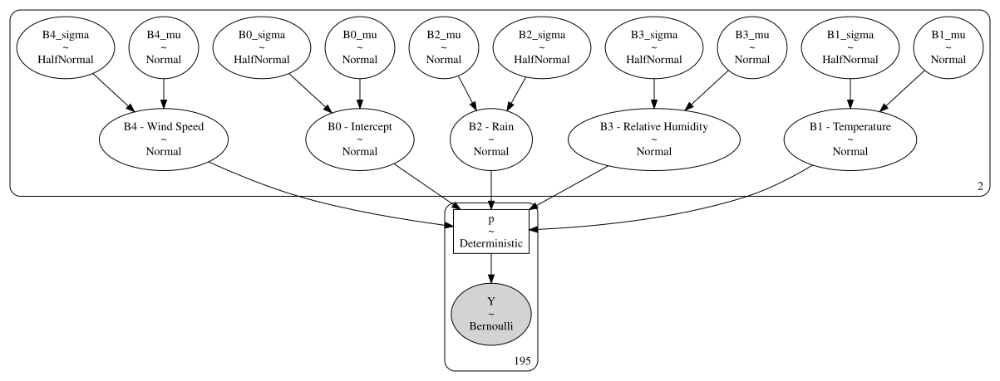

In [ ]:
with pm.Model() as hierarchical_measurement_model:

    B0_mu = pm.Normal('B0_mu', mu=0, sigma=2, shape=num_regions)
    B0_sigma = pm.HalfNormal('B0_sigma', sigma=10, shape=num_regions)
    B0 = pm.Normal('B0 - Intercept', mu = B0_mu, sigma = B0_sigma, shape= num_regions)

    B1_mu = pm.Normal('B1_mu', mu=0, sigma=2, shape=num_regions)
    B1_sigma = pm.HalfNormal('B1_sigma', sigma=10, shape=num_regions)
    B1 = pm.Normal('B1 - Temperature', mu = B1_mu, sigma = B1_sigma, shape= num_regions)

    B2_mu = pm.Normal('B2_mu', mu=0, sigma=2, shape=num_regions)
    B2_sigma = pm.HalfNormal('B2_sigma', sigma=10, shape=num_regions)
    B2 = pm.Normal('B2 - Rain', mu = B2_mu, sigma = B2_sigma, shape=num_regions)

    B3_mu = pm.Normal('B3_mu', mu=0, sigma=2, shape=num_regions)
    B3_sigma = pm.HalfNormal('B3_sigma', sigma=10, shape=num_regions)
    B3 = pm.Normal('B3 - Relative Humidity', mu = B3_mu, sigma = B3_sigma, shape=num_regions)

    B4_mu = pm.Normal('B4_mu', mu=0, sigma=2, shape=num_regions)
    B4_sigma = pm.HalfNormal('B4_sigma', sigma=10, shape=num_regions)
    B4 = pm.Normal('B4 - Wind Speed', mu = B4_mu, sigma = B4_sigma, shape=num_regions)

    eta = B0[region_ids] + B1[region_ids] * Temperature + B2[region_ids] * Rain + B3[region_ids] * RH + B4[region_ids] * Ws
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = response_data)

pm.model_to_graphviz(hierarchical_measurement_model)

In [ ]:
graph = pm.model_to_graphviz(hierarchical_measurement_model)
#graph.render(filename='path/to/exported/graph', format='png')

In [ ]:
with hierarchical_measurement_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    hierarchical_measurement_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

In [ ]:
az.summary(hierarchical_measurement_trace,  var_names =['B0 - Intercept'
                                                              ,'B1 - Temperature'
                                                              ,'B2 - Rain'
                                                              ,'B3 - Relative Humidity'
                                                              ,'B4 - Wind Speed'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept[0],-7.001,2.066,-11.266,-3.645,0.081,0.059,669.0,899.0,1.00
B0 - Intercept[1],0.129,0.364,-0.541,0.799,0.016,0.011,504.0,985.0,1.01
B1 - Temperature[0],1.685,0.570,0.690,2.818,0.020,0.015,853.0,999.0,1.00
B1 - Temperature[1],1.702,0.450,0.931,2.613,0.014,0.010,855.0,1197.0,1.00
B2 - Rain[0],-21.114,5.570,-31.914,-11.306,0.220,0.159,666.0,799.0,1.00
B2 - Rain[1],-2.688,0.783,-4.210,-1.288,0.024,0.018,1138.0,963.0,1.01
B3 - Relative Humidity[0],-0.435,0.569,-1.579,0.569,0.016,0.013,1226.0,1168.0,1.01
B3 - Relative Humidity[1],-0.774,0.398,-1.510,-0.024,0.018,0.013,475.0,431.0,1.01
B4 - Wind Speed[0],0.194,0.406,-0.642,0.924,0.021,0.015,445.0,140.0,1.01
B4 - Wind Speed[1],0.582,0.339,-0.066,1.218,0.012,0.008,832.0,1329.0,1.00


In [ ]:
az.summary(hierarchical_measurement_trace)['r_hat'].max()

1.03

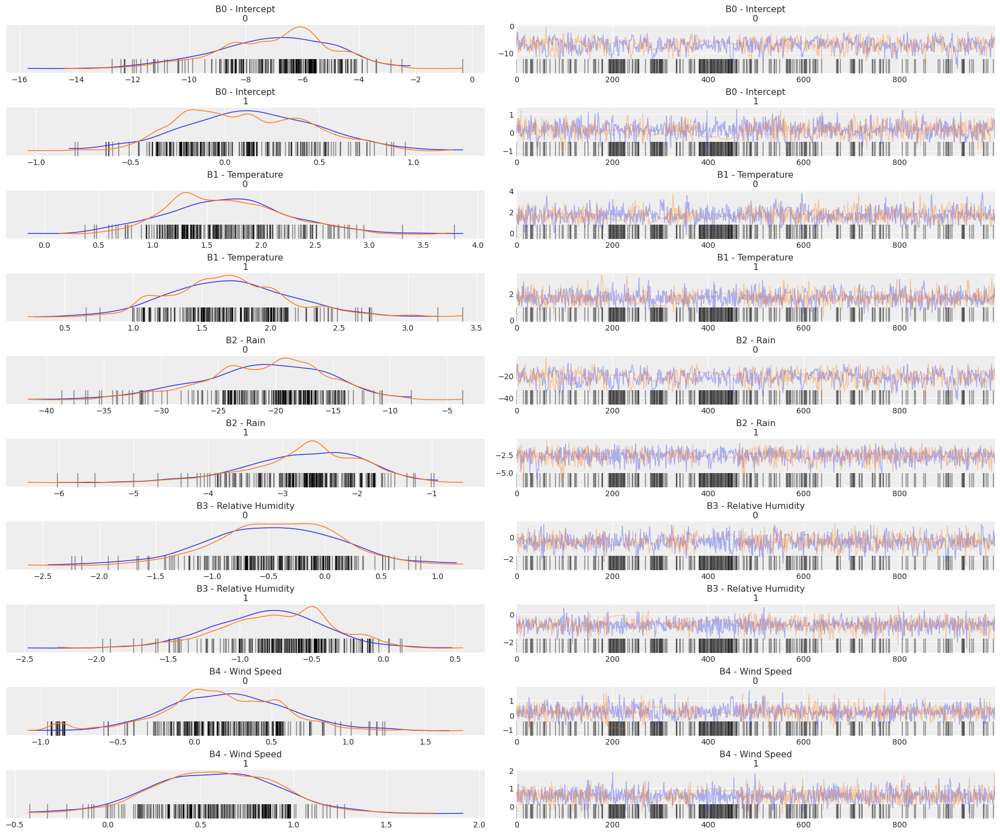

In [ ]:
az.plot_trace(hierarchical_measurement_trace, compact = False
              , var_names =['B0 - Intercept'
                            ,'B1 - Temperature'
                            ,'B2 - Rain'
                            ,'B3 - Relative Humidity'
                            ,'B4 - Wind Speed']
              , figsize = (18,15));

<Axes: title={'center': 'Y / Y'}>

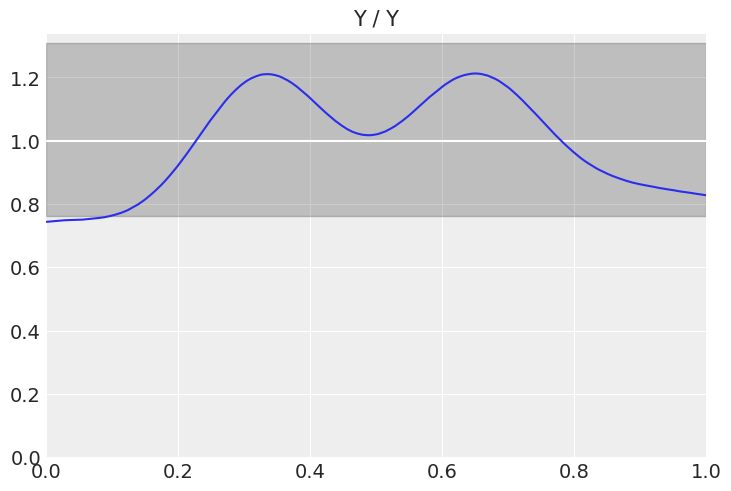

In [ ]:
hierarchical_measurement_pp = pm.sample_posterior_predictive(hierarchical_measurement_trace,
                                           model = hierarchical_measurement_model,
                                           random_seed = random_seed)
az.plot_bpv(hierarchical_measurement_pp)

<Axes: xlabel='Y / Y'>

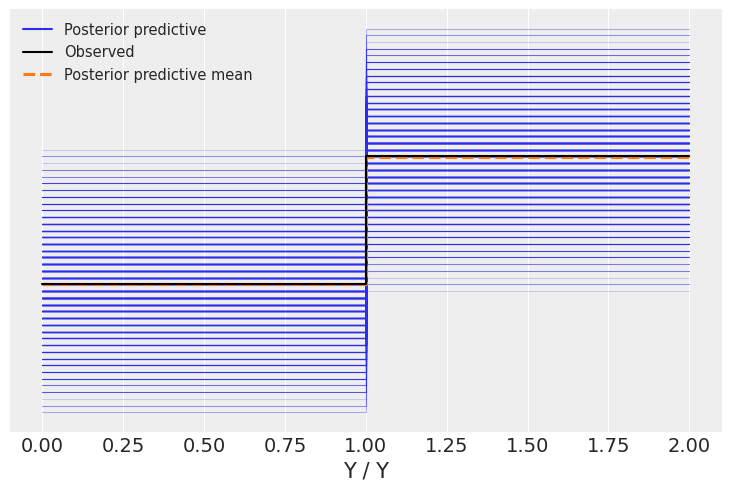

In [ ]:
az.plot_ppc(hierarchical_measurement_pp)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

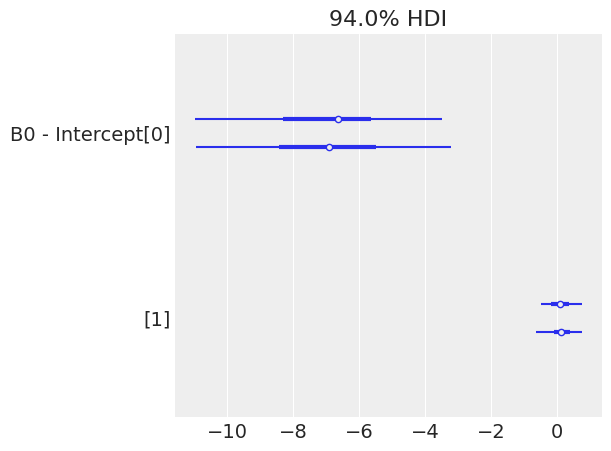

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B0 - Intercept'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

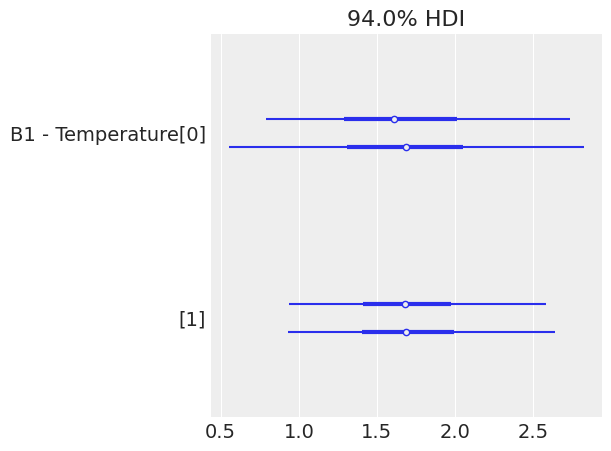

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B1 - Temperature'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

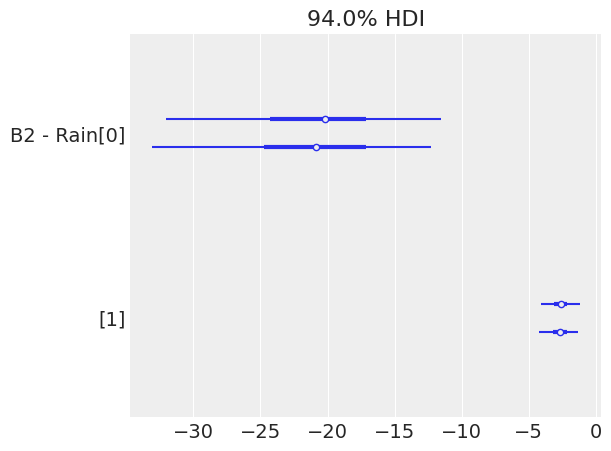

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B2 - Rain'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

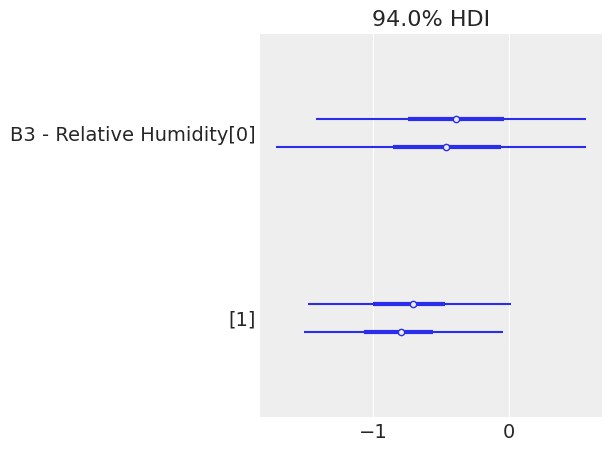

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B3 - Relative Humidity'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

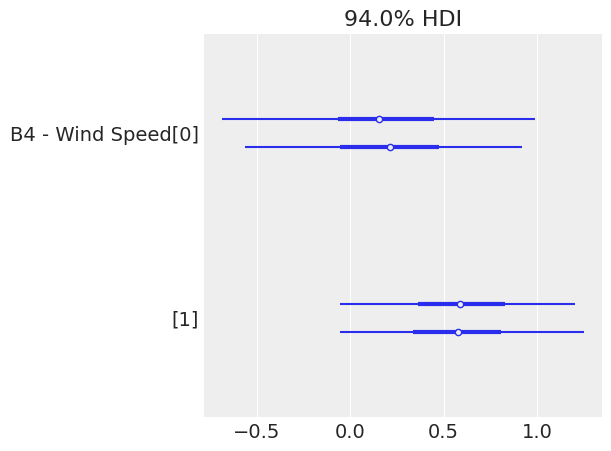

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B4 - Wind Speed'],)

array([[<Axes: title={'center': 'B0 - Intercept\n0'}>,
        <Axes: title={'center': 'B0 - Intercept\n1'}>,
        <Axes: title={'center': 'B1 - Temperature\n0'}>],
       [<Axes: title={'center': 'B1 - Temperature\n1'}>,
        <Axes: title={'center': 'B2 - Rain\n0'}>,
        <Axes: title={'center': 'B2 - Rain\n1'}>],
       [<Axes: title={'center': 'B3 - Relative Humidity\n0'}>,
        <Axes: title={'center': 'B3 - Relative Humidity\n1'}>,
        <Axes: title={'center': 'B4 - Wind Speed\n0'}>],
       [<Axes: title={'center': 'B4 - Wind Speed\n1'}>, <Axes: >,
        <Axes: >]], dtype=object)

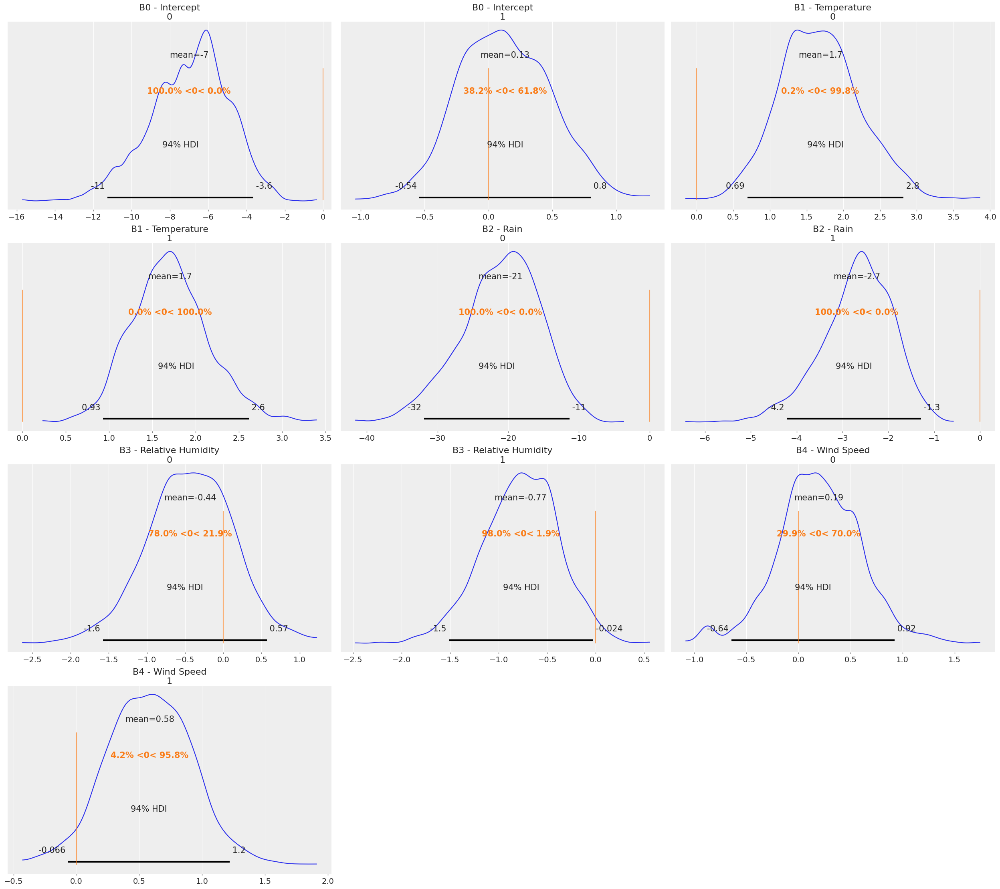

In [ ]:
az.plot_posterior(hierarchical_measurement_trace
                  , var_names =['B0 - Intercept'
                                ,'B1 - Temperature'
                                ,'B2 - Rain'
                                ,'B3 - Relative Humidity'
                                ,'B4 - Wind Speed']
                  , ref_val = 0,)

## Findings

In [ ]:
az.compare({'pooled':measurement_trace
            , 'unpooled':unpooled_measurement_trace}
            , ic='waic')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
unpooled,0,-77.410803,16.526498,0.000000,0.818622,12.411316,0.000000,True,log
pooled,1,-87.477481,12.957641,10.066678,0.181378,16.316792,6.830921,True,log


In [ ]:
az.compare({'hierarchical':hierarchical_measurement_trace
            , 'pooled':measurement_trace}
            , ic='waic')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
hierarchical,0,-76.253370,15.234220,0.000000,0.7966,11.294549,0.000000,True,log
pooled,1,-87.477481,12.957641,11.224112,0.2034,16.316792,8.040822,True,log


We see that both the hierarchical and unpooled models are preferred over the pooled model, as they capture the differences in the estimates between the groups.

In [ ]:
az.compare({'hierarchical':hierarchical_measurement_trace
            , 'unpooled':unpooled_measurement_trace}
            , ic='waic')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
hierarchical,0,-76.253370,15.234220,0.000000,1.0,11.294549,0.000000,True,log
unpooled,1,-77.410803,16.526498,1.157433,0.0,12.411316,1.521519,True,log


However, comparing the hierarchical and unpooled models, we see that hierarchical performs much stronger from the strength of using hierarchical priors and shrinking parameters.

The hierarchical model outperforms the pooled and unpooled model so we discuss the findings from this model with regards to the predictor coefficients.

The intercept was significant (non-zero) for the Bejaia region with a negative coefficient, indicating that there is less likelihood of forest fires compared to Sidi-Bel Abbes region holding all other variables constant.  

For both regions, temperature was a significant predictor with a very similar positive coefficient estimate, indicating that as temperature increases, the likelihood of forest fires increases, as expected.

For both regions, rain was a significant predictor with varying negative estimates. In the Bejaia region, rain decreases the odds of a forest fire occurring much more compared to the Sidi-Bel Abbes region.

For Sidi-Bel Abbes, humidity and wind speed both prove to be significant, where a decrease in humidity increases the odds of a forest fire and an increase in wind speed increases the odds of a forest fire, while these predictors were insignificant to the Bejaia region.

Given our model and findings, we suggest that it would be most beneficial to model the likelihood of fires using a hierarchical model to account for the difference in parameter estimates. Bejaia has a lower baseline for odds of forest fires compared to Sidi-Bel Abbes, while Sidi-Bel Abbes is more sensitive to humidity and wind speed. In addition, temperature and rain was a significant predictor for both regions, although rain had a much stronger impact for Bejaia.

# Is FWI best way to Predict Fires in Algeria?

## FWI Pooled

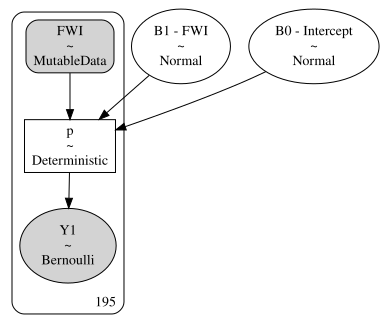

In [ ]:
with pm.Model() as FWI_model:

  fwi = pm.MutableData('FWI', FWI)

  B0 = pm.Normal('B0 - Intercept', mu = 0, sigma = 10)
  B1 = pm.Normal('B1 - FWI', mu = 0, sigma = 10)

  eta = B0 + B1 * fwi
  p = pm.Deterministic('p', pm.invlogit(eta))
  Y1 = pm.Bernoulli('Y1', p = p, observed = response_data)

pm.model_to_graphviz(FWI_model)

In [ ]:
graph = pm.model_to_graphviz(FWI_model)
#graph.render(filename='path/to/exported/graph4', format='png')

In [ ]:
with FWI_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    FWI_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

In [ ]:
az.summary(FWI_trace,  var_names =['B0 - Intercept','B1 - FWI'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept,6.062,1.268,3.80,8.427,0.072,0.051,308.0,409.0,1.01
B1 - FWI,12.283,2.271,8.23,16.478,0.129,0.092,318.0,407.0,1.01


In [ ]:
az.summary(FWI_trace)['r_hat'].max()

1.01

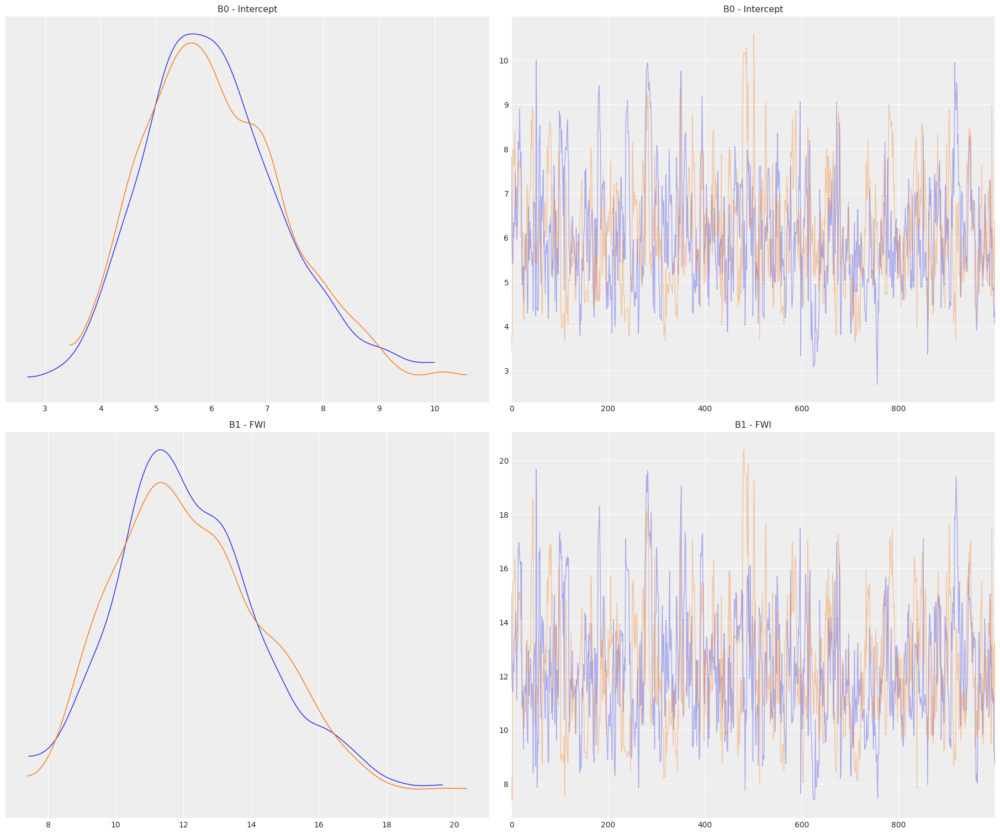

In [ ]:
az.plot_trace(FWI_trace, compact = False, var_names =['B0 - Intercept','B1 - FWI'], figsize = (18,15));

<Axes: title={'center': 'Y1 / Y1'}>

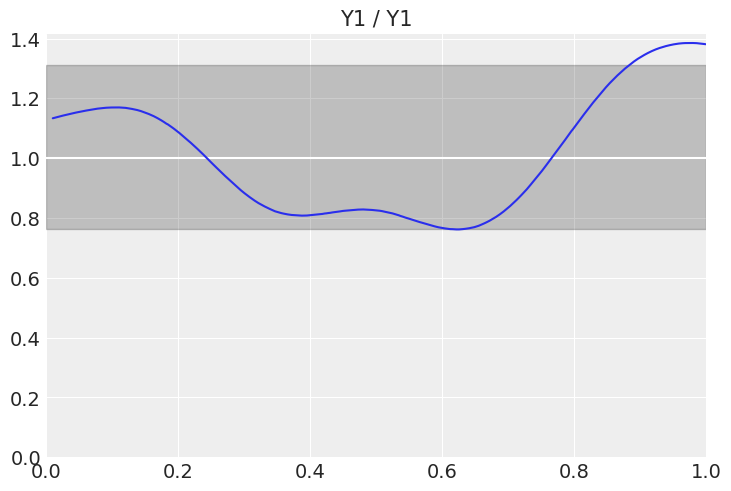

In [ ]:
FWI_pp = pm.sample_posterior_predictive(FWI_trace,
                                           model = FWI_model,
                                           random_seed = random_seed)
az.plot_bpv(FWI_pp)

<Axes: xlabel='Y1 / Y1'>

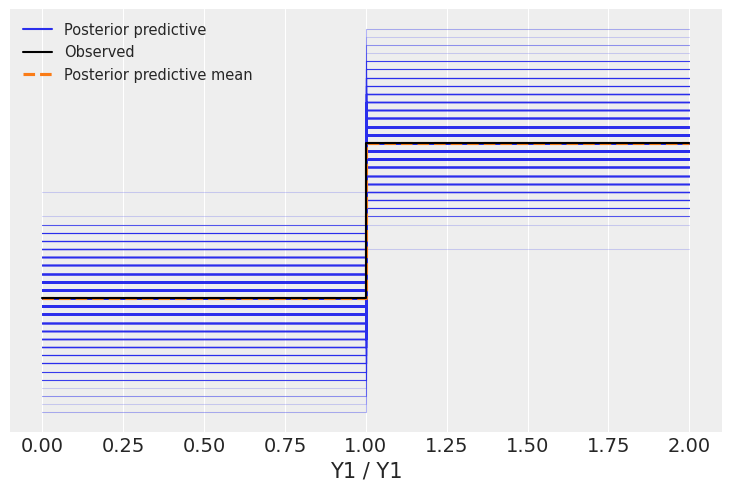

In [ ]:
az.plot_ppc(FWI_pp)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

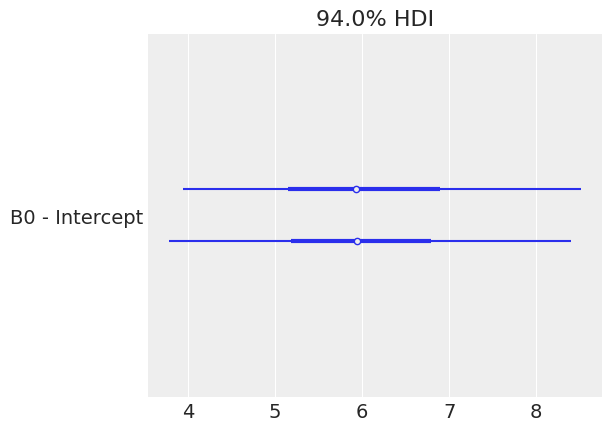

In [ ]:
az.plot_forest(FWI_trace, var_names =['B0 - Intercept'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

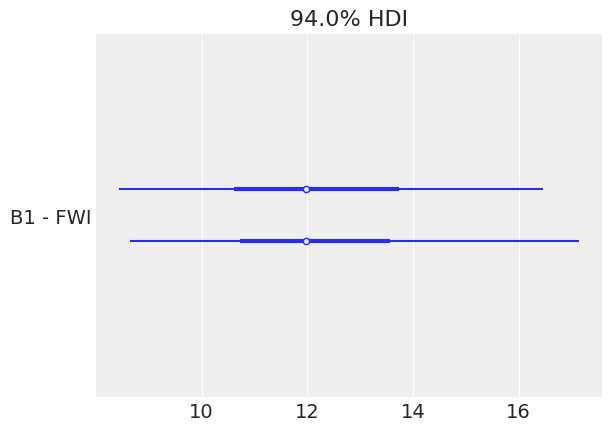

In [ ]:
az.plot_forest(FWI_trace, var_names =['B1 - FWI'],)

array([<Axes: title={'center': 'B0 - Intercept'}>,
       <Axes: title={'center': 'B1 - FWI'}>], dtype=object)

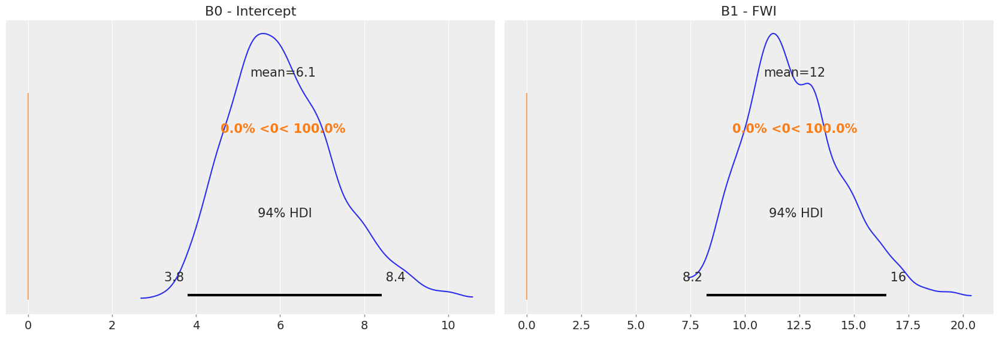

In [124]:
az.plot_posterior(FWI_trace, var_names =['B0 - Intercept',
                                         'B1 - FWI'],
                   ref_val = 0,)

## FWI Hierarchical

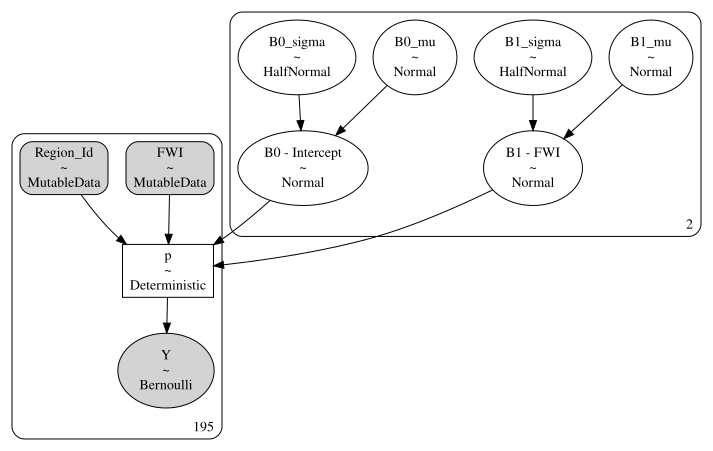

In [ ]:
with pm.Model() as hierarchical_FWI_model:
    fwi = pm.MutableData('FWI', FWI)
    r_id = pm.MutableData('Region_Id', region_ids)
    B0_mu = pm.Normal('B0_mu', mu=0, sigma=2, shape=num_regions)
    B0_sigma = pm.HalfNormal('B0_sigma', sigma=10, shape=num_regions)
    B0 = pm.Normal('B0 - Intercept', mu = B0_mu, sigma = B0_sigma, shape= num_regions)

    B1_mu = pm.Normal('B1_mu', mu=0, sigma=2, shape=num_regions)
    B1_sigma = pm.HalfNormal('B1_sigma', sigma=10, shape=num_regions)
    B1 = pm.Normal('B1 - FWI', mu = B1_mu, sigma = B1_sigma, shape= num_regions)

    eta = B0[r_id] + B1[r_id] * fwi
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = response_data)

pm.model_to_graphviz(hierarchical_FWI_model)

In [ ]:
graph = pm.model_to_graphviz(hierarchical_FWI_model)
#graph.render(filename='path/to/exported/graph5', format='png')

In [ ]:
with hierarchical_FWI_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    H_FWI_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

In [ ]:
az.summary(H_FWI_trace,  var_names =['B0 - Intercept','B1 - FWI'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept[0],4.256,1.344,1.859,6.788,0.055,0.040,661.0,778.0,1.0
B0 - Intercept[1],9.582,3.631,4.092,16.806,0.163,0.120,534.0,623.0,1.0
B1 - FWI[0],9.506,2.444,5.232,14.168,0.097,0.071,707.0,710.0,1.0
B1 - FWI[1],18.085,6.518,7.580,30.103,0.295,0.219,526.0,575.0,1.0


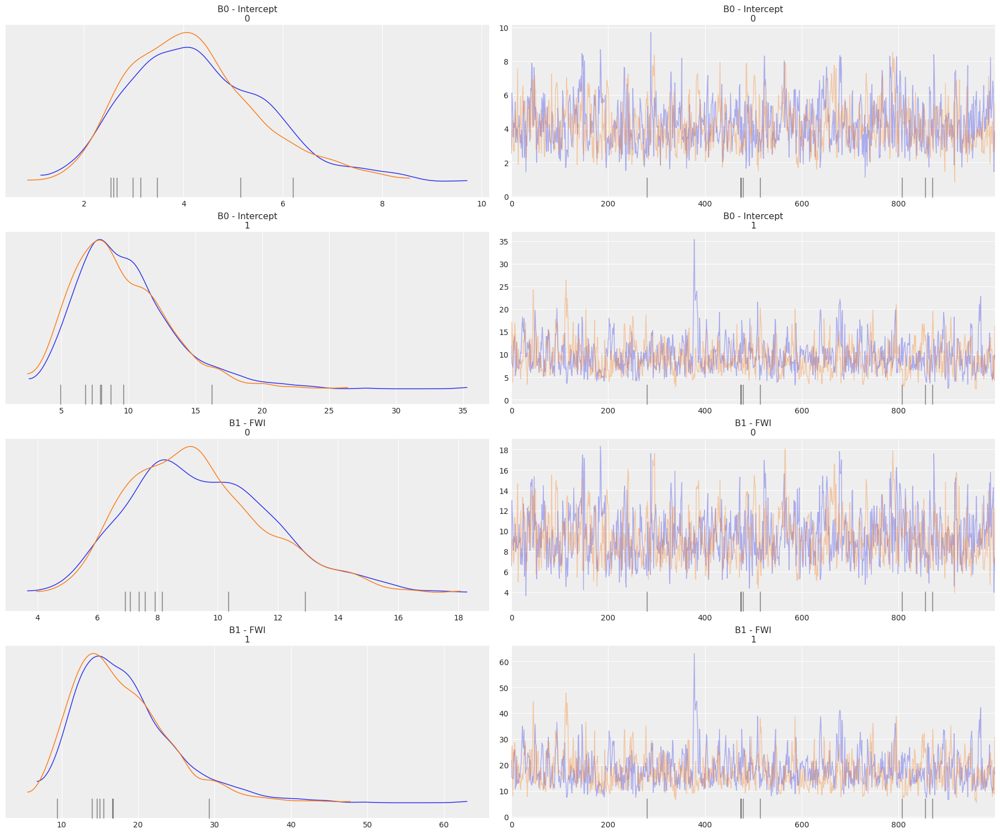

In [ ]:
az.plot_trace(H_FWI_trace, compact = False, var_names =['B0 - Intercept','B1 - FWI'], figsize = (18,15));

<Axes: title={'center': 'Y / Y'}>

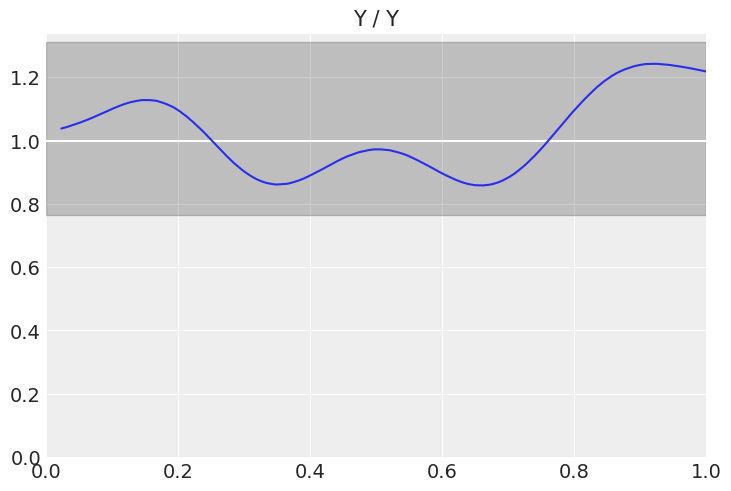

In [ ]:
H_FWI_pp = pm.sample_posterior_predictive(H_FWI_trace,
                                           model = hierarchical_FWI_model,
                                           random_seed = random_seed)
az.plot_bpv(H_FWI_pp)

<Axes: xlabel='Y / Y'>

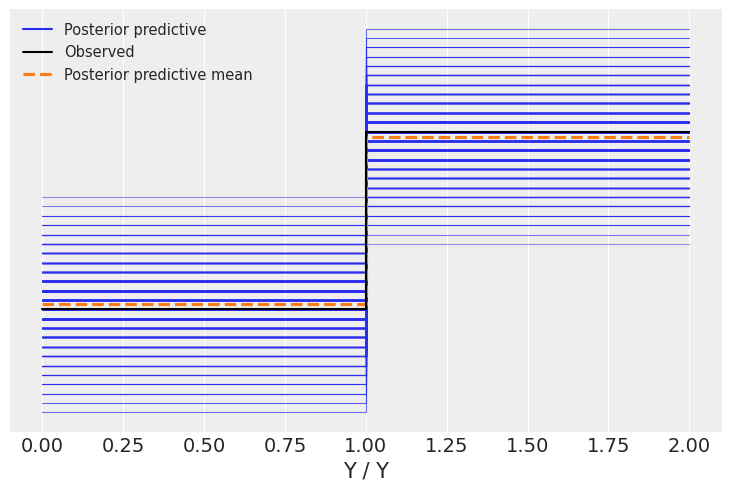

In [ ]:
az.plot_ppc(H_FWI_pp)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

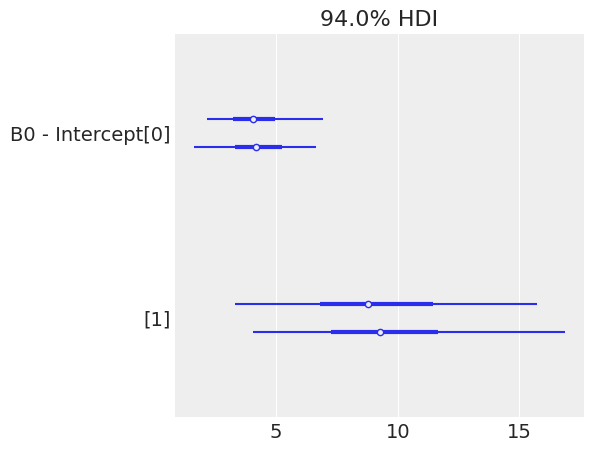

In [ ]:
az.plot_forest(H_FWI_trace, var_names =['B0 - Intercept'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

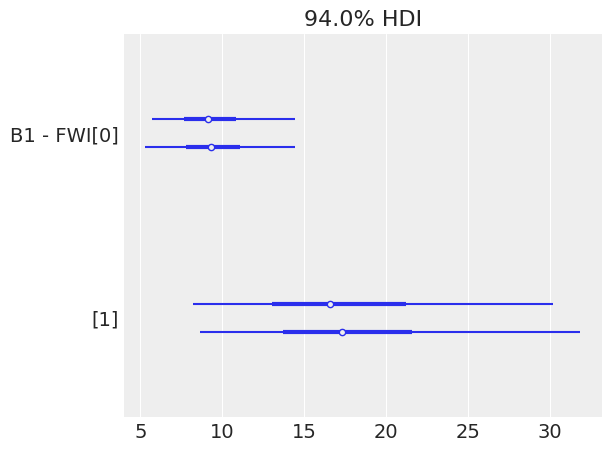

In [ ]:
az.plot_forest(H_FWI_trace, var_names =['B1 - FWI'],)

array([<Axes: title={'center': 'B0 - Intercept\n0'}>,
       <Axes: title={'center': 'B0 - Intercept\n1'}>,
       <Axes: title={'center': 'B1 - FWI\n0'}>,
       <Axes: title={'center': 'B1 - FWI\n1'}>], dtype=object)

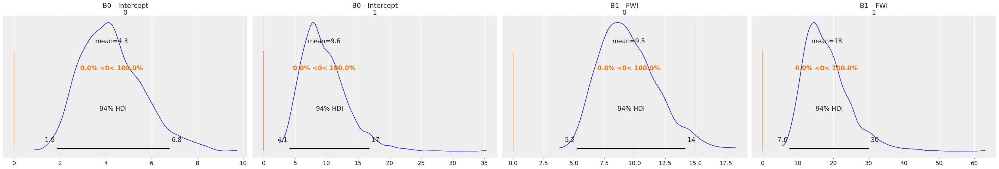

In [125]:
az.plot_posterior(H_FWI_trace, var_names =['B0 - Intercept',
                                         'B1 - FWI'],
                   ref_val = 0,)

We tried to build a hierarchical FWI model but find that the parameter estimates are similar between regions. We compare this FWI model to the pooled FWI model below.

## Findings

In [ ]:
az.compare({'Pooled FWI':FWI_trace
           , 'Hierarchical FWI': H_FWI_trace
            }
           , ic='waic')

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Hierarchical FWI,0,-24.075804,2.688700,0.000000,0.545222,4.960111,0.000000,False,log
Pooled FWI,1,-24.199289,1.608203,0.123485,0.454778,5.336402,1.466881,False,log


In [ ]:
az.compare({'FWI (Hierarchical)':H_FWI_trace
           , 'Measurements (Hierarchical)':hierarchical_measurement_trace
            }
           , ic='waic')


/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
FWI (Hierarchical),0,-24.075804,2.68870,0.000000,1.000000e+00,4.960111,0.000000,False,log
Measurements (Hierarchical),1,-76.253370,15.23422,52.177566,9.215739e-12,11.294549,11.308366,True,log


We find that the pooled FWI model completely outperforms our hierarchical model. We will try to improve on our hierarchical model by building another hierarchical model with a non linear term.

## Hierarchical - non linear

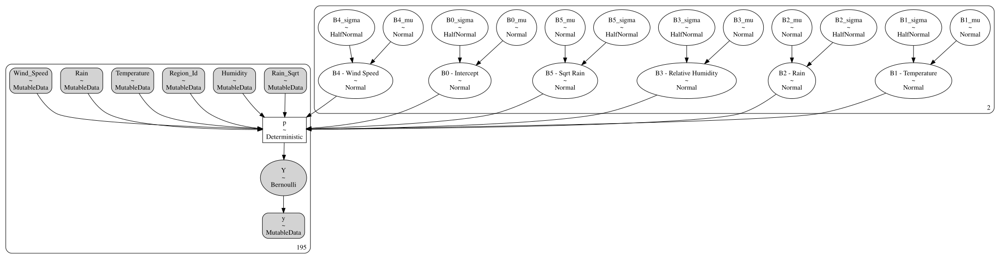

In [117]:
with pm.Model() as hierarchical_nonlin_measurement_model:
    temp = pm.MutableData('Temperature', Temperature)
    rain = pm.MutableData('Rain', Rain)
    r_sqrt = pm.MutableData('Rain_Sqrt', Rain_sqrt)
    humid = pm.MutableData('Humidity', RH)
    wind = pm.MutableData('Wind_Speed', Ws)

    r_id = pm.MutableData('Region_Id', region_ids)

    y = pm.MutableData("y", response_data)

    B0_mu = pm.Normal('B0_mu', mu=0, sigma=2, shape=num_regions)
    B0_sigma = pm.HalfNormal('B0_sigma', sigma=10, shape=num_regions)
    B0 = pm.Normal('B0 - Intercept', mu = B0_mu, sigma = B0_sigma, shape= num_regions)

    B1_mu = pm.Normal('B1_mu', mu=0, sigma=2, shape=num_regions)
    B1_sigma = pm.HalfNormal('B1_sigma', sigma=10, shape=num_regions)
    B1 = pm.Normal('B1 - Temperature', mu = B1_mu, sigma = B1_sigma, shape= num_regions)

    B2_mu = pm.Normal('B2_mu', mu=0, sigma=2, shape=num_regions)
    B2_sigma = pm.HalfNormal('B2_sigma', sigma=10, shape=num_regions)
    B2 = pm.Normal('B2 - Rain', mu = B2_mu, sigma = B2_sigma, shape=num_regions)

    B3_mu = pm.Normal('B3_mu', mu=0, sigma=2, shape=num_regions)
    B3_sigma = pm.HalfNormal('B3_sigma', sigma=10, shape=num_regions)
    B3 = pm.Normal('B3 - Relative Humidity', mu = B3_mu, sigma = B3_sigma, shape=num_regions)

    B4_mu = pm.Normal('B4_mu', mu=0, sigma=2, shape=num_regions)
    B4_sigma = pm.HalfNormal('B4_sigma', sigma=10, shape=num_regions)
    B4 = pm.Normal('B4 - Wind Speed', mu = B4_mu, sigma = B4_sigma, shape=num_regions)

    B5_mu = pm.Normal('B5_mu', mu=0, sigma=2, shape=num_regions)
    B5_sigma = pm.HalfNormal('B5_sigma', sigma=10, shape=num_regions)
    B5 = pm.Normal('B5 - Sqrt Rain', mu = B5_mu, sigma = B5_sigma, shape=num_regions)

    eta = B0[r_id] + B1[r_id] * temp + B2[r_id] * rain + B3[r_id] * humid + B4[r_id] * wind + B5[r_id] * r_sqrt
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = y)

pm.model_to_graphviz(hierarchical_nonlin_measurement_model)

In [118]:
graph = pm.model_to_graphviz(hierarchical_nonlin_measurement_model)
#graph.render(filename='path/to/exported/graph6', format='png')

In [119]:
with hierarchical_nonlin_measurement_model:
    trace = pm.sample(random_seed = random_seed, return_inferencedata=False)
    hierarchical_nonlin_measurement_trace = pm.to_inference_data(trace=trace, log_likelihood=True)

In [120]:
az.summary(hierarchical_nonlin_measurement_trace,  var_names =['B0 - Intercept'
                                                              ,'B1 - Temperature'
                                                              ,'B2 - Rain'
                                                              ,'B3 - Relative Humidity'
                                                              ,'B4 - Wind Speed'
                                                              ,'B5 - Sqrt Rain'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0 - Intercept[0],-2.583,1.839,-5.745,0.110,0.111,0.086,375.0,333.0,1.00
B0 - Intercept[1],0.972,0.494,0.084,1.907,0.023,0.017,496.0,649.0,1.01
B1 - Temperature[0],1.740,0.643,0.530,2.902,0.023,0.016,763.0,706.0,1.00
B1 - Temperature[1],2.843,0.839,1.303,4.289,0.046,0.033,365.0,446.0,1.00
B2 - Rain[0],-3.146,6.243,-13.943,4.979,0.391,0.293,348.0,315.0,1.01
B2 - Rain[1],5.515,2.034,1.745,8.928,0.140,0.102,223.0,394.0,1.00
B3 - Relative Humidity[0],-0.631,0.573,-1.657,0.456,0.021,0.015,728.0,955.0,1.00
B3 - Relative Humidity[1],-1.947,0.718,-3.178,-0.543,0.040,0.029,341.0,500.0,1.00
B4 - Wind Speed[0],0.334,0.406,-0.382,1.141,0.015,0.011,735.0,1026.0,1.00
B4 - Wind Speed[1],0.848,0.523,-0.090,1.833,0.028,0.024,389.0,357.0,1.00


In [121]:
az.summary(hierarchical_nonlin_measurement_trace)['r_hat'].max()

1.02

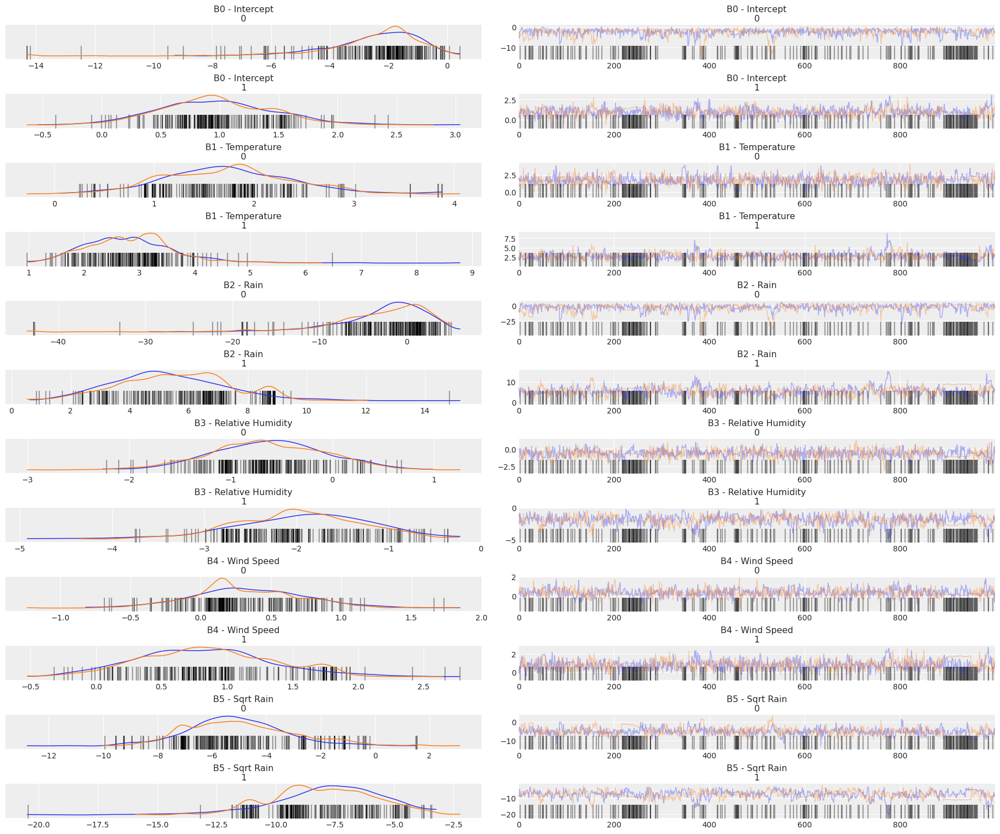

In [ ]:
az.plot_trace(hierarchical_nonlin_measurement_trace, compact = False, var_names =['B0 - Intercept'
                                                              ,'B1 - Temperature'
                                                              ,'B2 - Rain'
                                                              ,'B3 - Relative Humidity'
                                                              ,'B4 - Wind Speed'
                                                              ,'B5 - Sqrt Rain']
              , figsize = (18,15));

<Axes: title={'center': 'Y / Y'}>

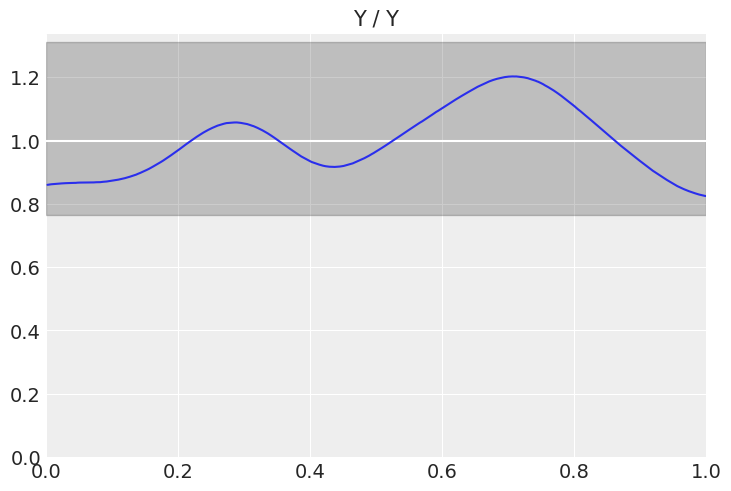

In [ ]:
hierarchical_nonlin_measurement_pp = pm.sample_posterior_predictive(hierarchical_nonlin_measurement_trace,
                                           model = hierarchical_nonlin_measurement_model,
                                           random_seed = random_seed)
az.plot_bpv(hierarchical_nonlin_measurement_pp)

<Axes: xlabel='Y / Y'>

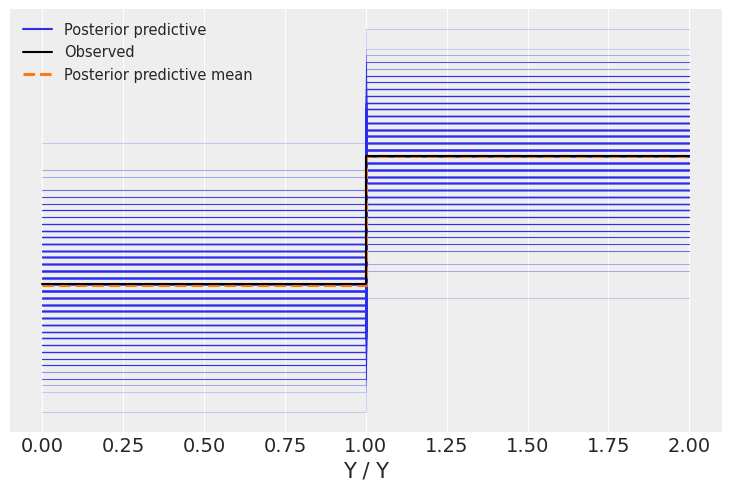

In [ ]:
az.plot_ppc(hierarchical_nonlin_measurement_pp)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

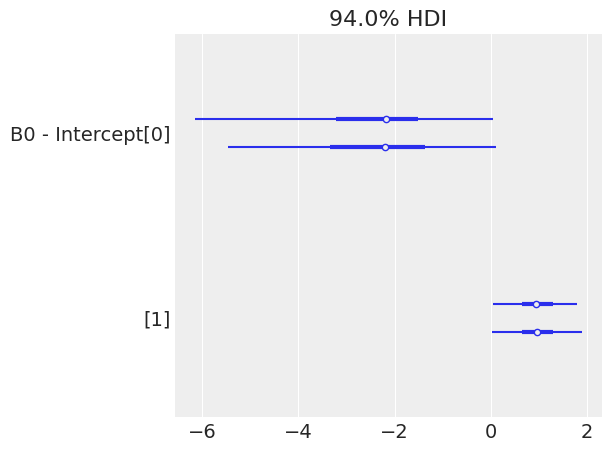

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B0 - Intercept'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

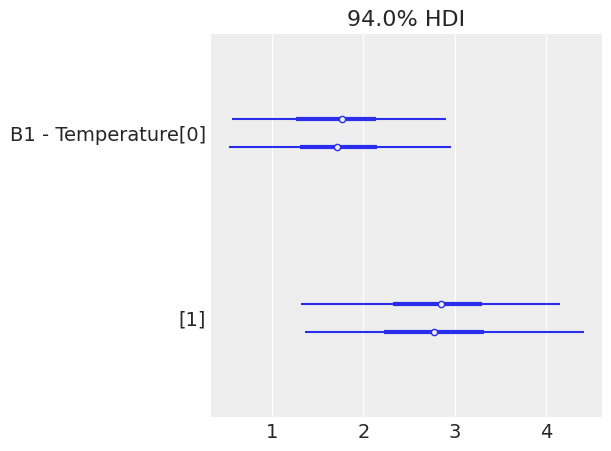

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B1 - Temperature'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

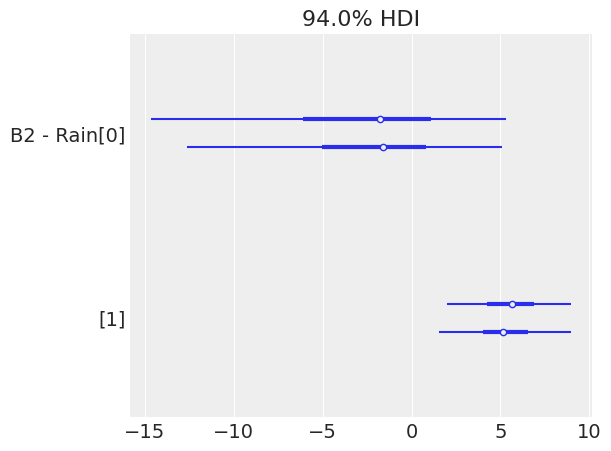

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B2 - Rain'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

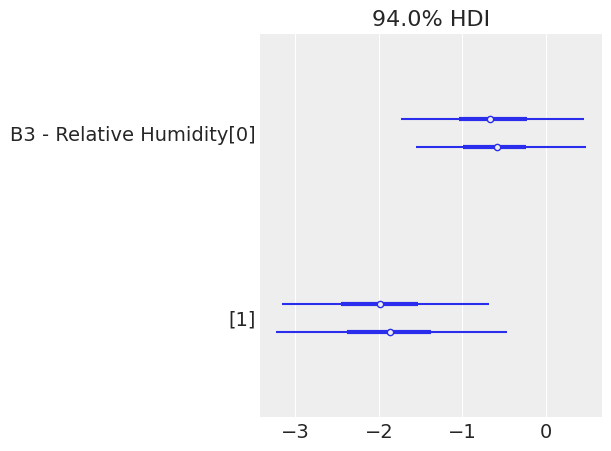

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B3 - Relative Humidity'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

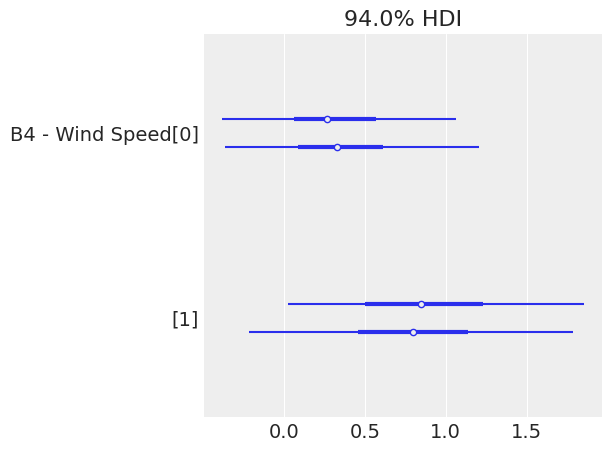

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B4 - Wind Speed'],)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

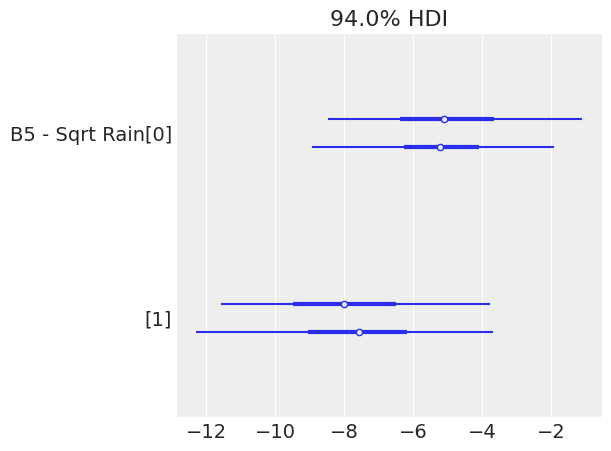

In [ ]:
az.plot_forest(hierarchical_nonlin_measurement_trace, var_names =['B5 - Sqrt Rain'],)

array([[<Axes: title={'center': 'B0 - Intercept\n0'}>,
        <Axes: title={'center': 'B0 - Intercept\n1'}>,
        <Axes: title={'center': 'B1 - Temperature\n0'}>],
       [<Axes: title={'center': 'B1 - Temperature\n1'}>,
        <Axes: title={'center': 'B2 - Rain\n0'}>,
        <Axes: title={'center': 'B2 - Rain\n1'}>],
       [<Axes: title={'center': 'B3 - Relative Humidity\n0'}>,
        <Axes: title={'center': 'B3 - Relative Humidity\n1'}>,
        <Axes: title={'center': 'B4 - Wind Speed\n0'}>],
       [<Axes: title={'center': 'B4 - Wind Speed\n1'}>,
        <Axes: title={'center': 'B5 - Sqrt Rain\n0'}>,
        <Axes: title={'center': 'B5 - Sqrt Rain\n1'}>]], dtype=object)

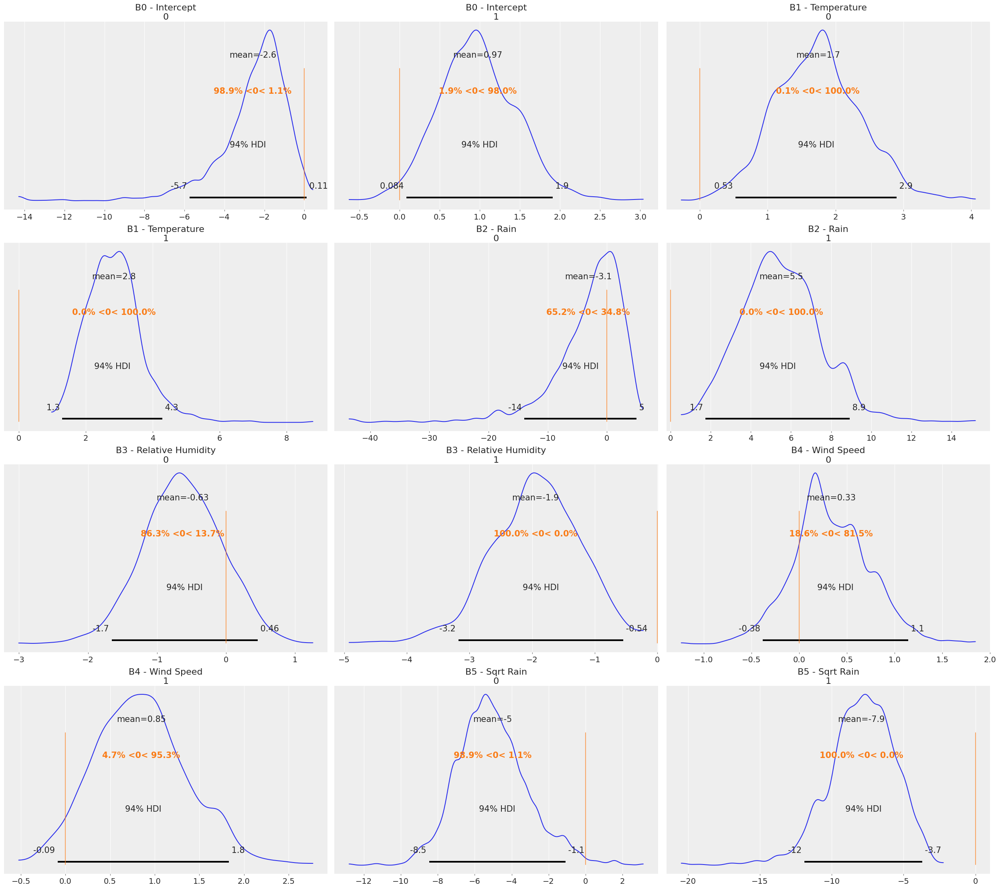

In [133]:
az.plot_posterior(hierarchical_nonlin_measurement_trace
                  , var_names =['B0 - Intercept'
                                ,'B1 - Temperature'
                                ,'B2 - Rain'
                                ,'B3 - Relative Humidity'
                                ,'B4 - Wind Speed'
                                , 'B5 - Sqrt Rain']
                  , ref_val = 0,)

## Findings part 2

In [ ]:
az.compare({'Measurements (Linear Hierarchical)':hierarchical_measurement_trace
           , 'Measurements (Nonlinear Hierarchical)':hierarchical_nonlin_measurement_trace
            }
           , ic='waic')


/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Measurements (Nonlinear Hierarchical),0,-59.35426,12.453843,0.00000,1.000000e+00,8.715021,0.000000,True,log
Measurements (Linear Hierarchical),1,-76.25337,15.234220,16.89911,2.735590e-13,11.294549,8.119373,True,log


In [ ]:
az.compare({'FWI (Hierarchical)':H_FWI_trace
           , 'Measurements (Nonlinear Hierarchical)':hierarchical_nonlin_measurement_trace
            }
           , ic='waic')


/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
FWI (Hierarchical),0,-24.075804,2.688700,0.000000,1.0,4.960111,0.000000,False,log
Measurements (Nonlinear Hierarchical),1,-59.354260,12.453843,35.278456,0.0,8.715021,9.086822,True,log


Our non linear hierarchical model with a square root transformation of rain seems to be better than our linear hierarchical model, but does not capture any weight when compared to the hierarchical FWI. Although we improved our model, it is safe to say that the Fire Weather Index is the best predictor of fires that combines all of the predictors that we have used in our models.

## Predictions

In [ ]:
scaler = StandardScaler()
fires_test[continuous_cols] = scaler.fit_transform(fires_test[continuous_cols])
Rain_sqrt_test = fires_test['Rain_sqrt'].values
month_test = fires_test['month'].values
Temperature_test = fires_test['Temperature'].values
RH_test = fires_test['RH'].values
Ws_test = fires_test['Ws'].values
Rain_test = fires_test['Rain'].values
FFMC_test = fires_test['FFMC'].values
DMC_test = fires_test['DMC'].values
DC_test = fires_test['DC'].values
ISI_test = fires_test['ISI'].values
BUI_test = fires_test['BUI'].values
FWI_test = fires_test['FWI'].values
region_ids_test = pd.Categorical(fires_test["region"]).codes
response_data_test = fires_test['Classes_binary'].values

### Hierarchical Non-Linear Predictions

In [ ]:
with hierarchical_nonlin_measurement_model:
  # Test data
  pm.set_data({'Temperature': Temperature_test
               ,'Rain':Rain_test
               ,'Rain_Sqrt':Rain_sqrt_test
               ,'Humidity':RH_test
               ,'Wind_Speed': Ws_test
               ,'Region_Id':region_ids_test
               })
  #Predict outcomes & probabilities
  nonlin_test_pp = pm.sample_posterior_predictive(
    hierarchical_nonlin_measurement_trace,
    var_names = ["p"],
    return_inferencedata=True,
    predictions=True,
    extend_inferencedata=True,
    random_seed = random_seed)

In [ ]:
threshold = 0.5
mean_pred = nonlin_test_pp.predictions["p"].mean(dim=["chain", "draw"])
y_test_pred = (mean_pred >= threshold).astype("int")

In [ ]:
print(f"accuracy = {accuracy_score(y_true=response_data_test, y_pred=y_test_pred): 0.3f}")

accuracy =  0.857


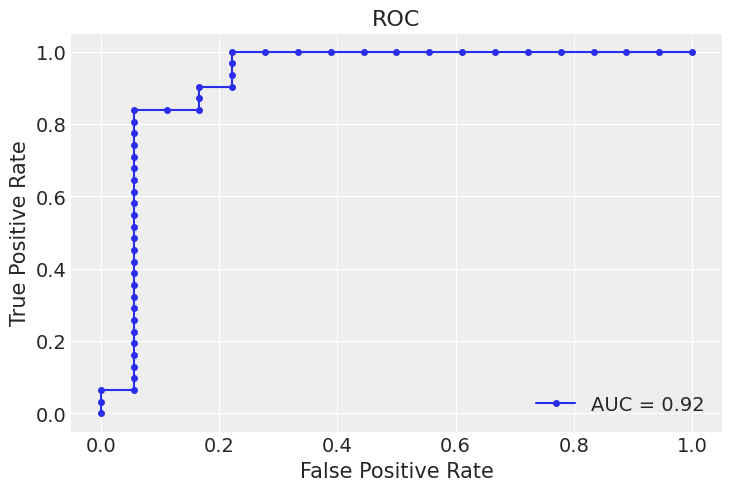

In [ ]:
fpr, tpr, thresholds = roc_curve(
y_true=response_data_test, y_score=mean_pred, pos_label=1, drop_intermediate=False
)
roc_auc = auc(fpr, tpr)
fig, ax = plt.subplots()
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
roc_display = roc_display.plot(ax=ax, marker="o", markersize=4)
ax.set(title="ROC");


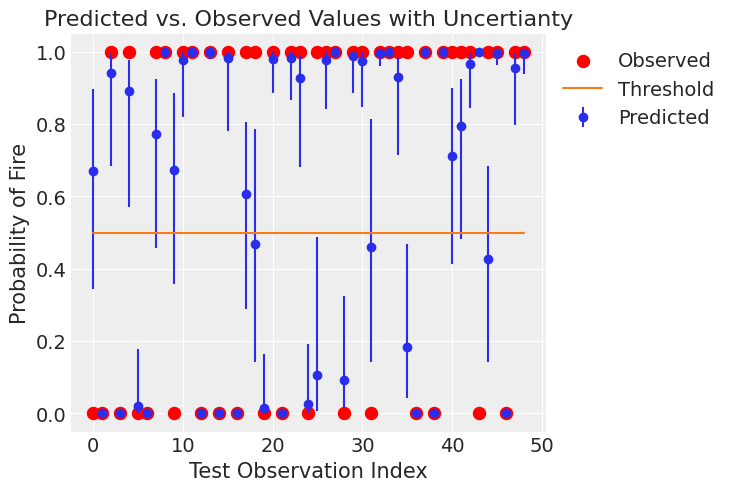

In [131]:
quantiles = nonlin_test_pp.predictions["p"].quantile((0.025, 0.25, 0.5, 0.75, 0.975), dim=("chain", "draw"))
preds = fires_test.reset_index().join(pd.DataFrame(quantiles).rename(index={0:"0.025 pred", 1: "0.25 pred", 2: "0.5 pred (median)", 3: "0.75 pred", 4: "0.975 pred"}).T)

plt.scatter(preds.index, preds['Classes_binary'], color='red', label='Observed',s=75)

# Plot the median as a point with error bars
plt.errorbar(
    x=preds.index,
    y=preds["0.5 pred (median)"],
    yerr=[preds["0.5 pred (median)"] - preds["0.025 pred"], preds["0.975 pred"]- preds["0.5 pred (median)"]],
    fmt='o',
    label="Predicted"
)

plt.plot(preds.index, np.linspace(0.5, 0.5, len(preds)), label = 'Threshold')

plt.xlabel("Test Observation Index")
plt.ylabel("Probability of Fire")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Predicted vs. Observed Values with Uncertianty")


plt.show()

### Hierarchical FWI Predictions

In [ ]:
with hierarchical_FWI_model:
  # Test data
  pm.set_data({'FWI': FWI_test
               ,'Region_Id':region_ids_test})
  #Predict outcomes & probabilities
  FWI_test_pp = pm.sample_posterior_predictive(
    H_FWI_trace,
    var_names = ["p"],
    return_inferencedata=True,
    predictions=True,
    extend_inferencedata=True,
    random_seed = random_seed)

In [ ]:
threshold = 0.5
mean_pred = FWI_test_pp.predictions["p"].mean(dim=["chain", "draw"])
y_test_pred = (mean_pred >= threshold).astype("int")

In [ ]:
print(f"accuracy = {accuracy_score(y_true=response_data_test, y_pred=y_test_pred): 0.3f}")

accuracy =  0.939


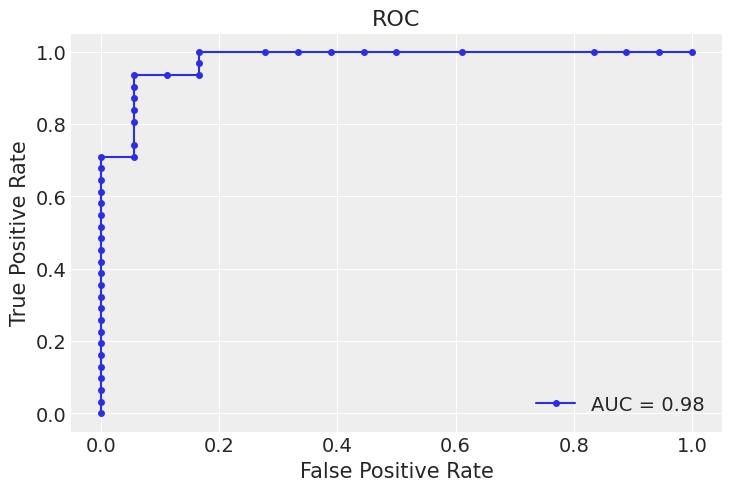

In [ ]:
fpr, tpr, thresholds = roc_curve(
y_true=response_data_test, y_score=mean_pred, pos_label=1, drop_intermediate=False
)
roc_auc = auc(fpr, tpr)
fig, ax = plt.subplots()
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
roc_display = roc_display.plot(ax=ax, marker="o", markersize=4)
ax.set(title="ROC");


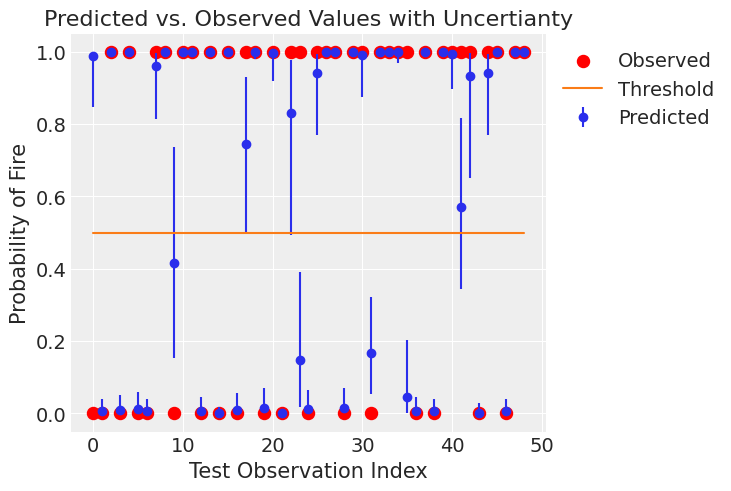

In [130]:
quantiles = FWI_test_pp.predictions["p"].quantile((0.025, 0.25, 0.5, 0.75, 0.975), dim=("chain", "draw"))
preds = fires_test.reset_index().join(pd.DataFrame(quantiles).rename(index={0:"0.025 pred", 1: "0.25 pred", 2: "0.5 pred (median)", 3: "0.75 pred", 4: "0.975 pred"}).T)

plt.scatter(preds.index, preds['Classes_binary'], color='red', label='Observed',s=75)

# Plot the median as a point with error bars
plt.errorbar(
    x=preds.index,
    y=preds["0.5 pred (median)"],
    yerr=[preds["0.5 pred (median)"] - preds["0.025 pred"], preds["0.975 pred"]- preds["0.5 pred (median)"]],
    fmt='o',
    label="Predicted"
)

plt.plot(preds.index, np.linspace(0.5, 0.5, len(preds)), label = 'Threshold')

plt.xlabel("Test Observation Index")
plt.ylabel("Probability of Fire")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Predicted vs. Observed Values with Uncertianty")


plt.show()

# Appendix Code

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

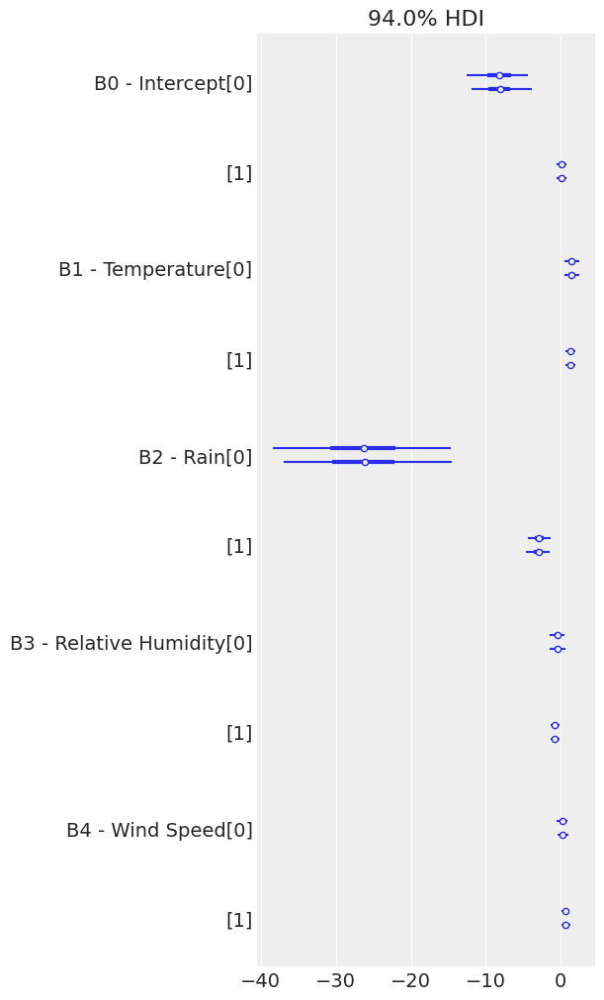

In [ ]:
az.plot_forest(hierarchical_measurement_trace, var_names =['B0 - Intercept'
,'B1 - Temperature'
,'B2 - Rain'
, 'B3 - Relative Humidity'
, 'B4 - Wind Speed'],)


In [ ]:
num_regions = len(fires['region'].unique())
region_unique = fires['region'].unique()
response_data = fires['Classes_binary'].values

In [ ]:
continuous_cols = ['Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'FWI']
scaler = StandardScaler()
fires[continuous_cols] = scaler.fit_transform(fires[continuous_cols])

In [ ]:
fires.columns

Index(['day', 'month', 'Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC',
       'ISI', 'BUI', 'FWI', 'Classes', 'region', 'region_dummy',
       'Classes_binary', 'FFMC_log'],
      dtype='object')

In [ ]:
month = fires['month'].values
Temperature = fires['Temperature'].values
RH = fires['RH'].values
Ws = fires['Ws'].values
Rain = fires['Rain'].values
FFMC = fires['FFMC'].values
DMC = fires['DMC'].values
DC = fires['DC'].values
ISI = fires['ISI'].values
BUI = fires['BUI'].values
FWI = fires['FWI'].values

<ipython-input-360-5f7fd4595b39>:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=fires[fires['Classes_binary']==1], x='Ws', bins=30, palette="viridis")


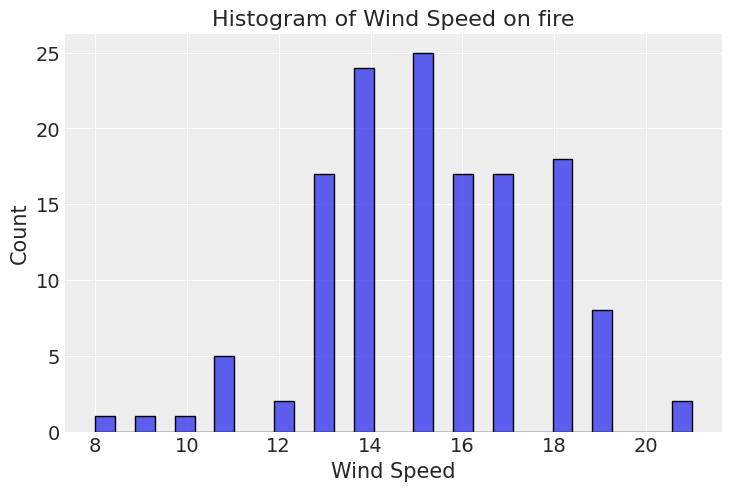

In [ ]:
# Replace 'binary outcome' and 'wind speed' with your actual column names
sns.histplot(data=fires[fires['Classes_binary']==1], x='Ws', bins=30, palette="viridis")

plt.title('Histogram of Wind Speed on fire')
plt.xlabel('Wind Speed')
plt.ylabel('Count')

plt.show()


<ipython-input-361-4a86575efebe>:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=fires[fires['Classes_binary']==0], x='Ws', bins=30, palette="viridis")


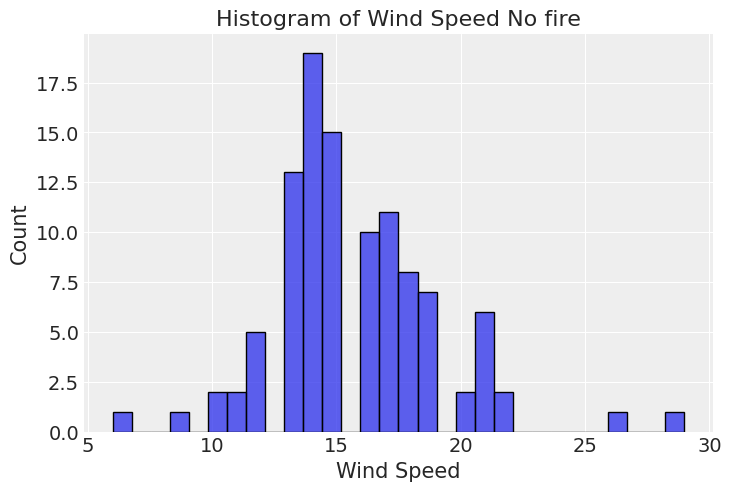

In [ ]:
# Replace 'binary outcome' and 'wind speed' with your actual column names
sns.histplot(data=fires[fires['Classes_binary']==0], x='Ws', bins=30, palette="viridis")

plt.title('Histogram of Wind Speed No fire')
plt.xlabel('Wind Speed')
plt.ylabel('Count')

plt.show()


### Model 1 - Pooled model

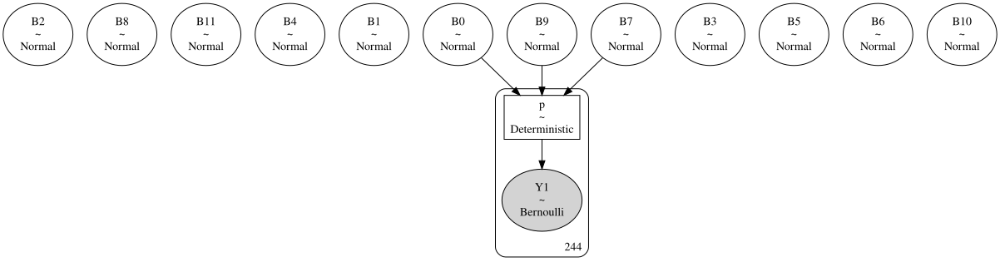

In [ ]:
#best with extra predictors
with pm.Model() as pooled_model_2:
  B0 = pm.Normal('B0', mu = 0, sigma = 10)
  B1 = pm.Normal('B1', mu = 0, sigma = 10)
  B2 = pm.Normal('B2', mu = 0, sigma = 10)
  B3 = pm.Normal('B3', mu = 0, sigma = 10)
  B4 = pm.Normal('B4', mu = 0, sigma = 10)
  B5 = pm.Normal('B5', mu = 0, sigma = 10)
  B6 = pm.Normal('B6', mu = 0, sigma = 10)
  B7 = pm.Normal('B7', mu = 0, sigma = 10)
  B8 = pm.Normal('B8', mu = 0, sigma = 10)
  B9 = pm.Normal('B9', mu = 0, sigma = 10)
  B10 = pm.Normal('B10', mu = 0, sigma = 10)
  B11 = pm.Normal('B11', mu = 0, sigma = 10)

  eta = B0 + B7 * BUI + B9 * ISI
  p = pm.Deterministic('p', pm.invlogit(eta))
  Y1 = pm.Bernoulli('Y1', p = p, observed = response_data)

pm.model_to_graphviz(pooled_model_2)

In [ ]:
# BEST SIMPLE MODEL
with pm.Model() as pooled_measurement_model:
  B0 = pm.Normal('B0', mu = 0, sigma = 10)
  B1 = pm.Normal('B1', mu = 0, sigma = 10)
  B2 = pm.Normal('B2', mu = 0, sigma = 10)
  B3 = pm.Normal('B3', mu = 0, sigma = 10)
  B4 = pm.Normal('B4', mu = 0, sigma = 10)
  B5 = pm.Normal('B5', mu = 0, sigma = 10)
  B6 = pm.Normal('B6', mu = 0, sigma = 10)
  B7 = pm.Normal('B7', mu = 0, sigma = 10)
  B8 = pm.Normal('B8', mu = 0, sigma = 10)
  B9 = pm.Normal('B9', mu = 0, sigma = 10)
  B10 = pm.Normal('B10', mu = 0, sigma = 10)
  B11 = pm.Normal('B11', mu = 0, sigma = 10)

  eta = B0 + B1 * Temperature + B2 * Rain + B3 * RH + B4 * Ws
  p = pm.Deterministic('p', pm.invlogit(eta))
  Y1 = pm.Bernoulli('Y1', p = p, observed = response_data)

pm.model_to_graphviz(pooled_model)

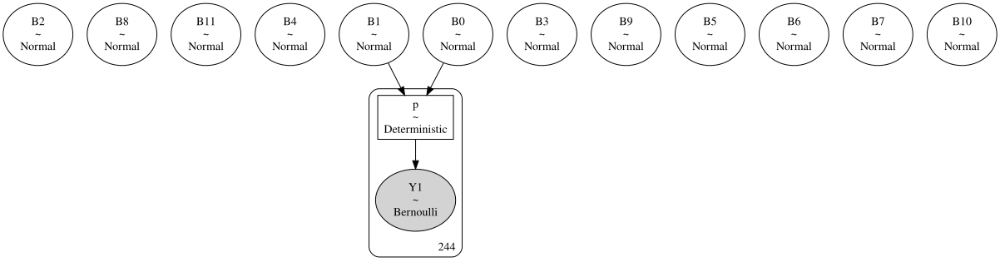

In [ ]:
#Just FWI
with pm.Model() as pooled_FWI_model:
  B0 = pm.Normal('B0', mu = 0, sigma = 10)
  B1 = pm.Normal('B1', mu = 0, sigma = 10)
  B2 = pm.Normal('B2', mu = 0, sigma = 10)
  B3 = pm.Normal('B3', mu = 0, sigma = 10)
  B4 = pm.Normal('B4', mu = 0, sigma = 10)
  B5 = pm.Normal('B5', mu = 0, sigma = 10)
  B6 = pm.Normal('B6', mu = 0, sigma = 10)
  B7 = pm.Normal('B7', mu = 0, sigma = 10)
  B8 = pm.Normal('B8', mu = 0, sigma = 10)
  B9 = pm.Normal('B9', mu = 0, sigma = 10)
  B10 = pm.Normal('B10', mu = 0, sigma = 10)
  B11 = pm.Normal('B11', mu = 0, sigma = 10)

  eta = B0 + B1 * FWI
  p = pm.Deterministic('p', pm.invlogit(eta))
  Y1 = pm.Bernoulli('Y1', p = p, observed = response_data)

pm.model_to_graphviz(pooled_FWI_model)

In [ ]:
with pm.Model() as FWI_hierarchical_model:
    B0_mu = pm.Normal('B0_mu', mu=0, sigma=2, shape=num_regions)
    B0_sigma = pm.HalfNormal('B0_sigma', sigma=10, shape=num_regions)
    B0 = pm.Normal('B0', mu = B0_mu, sigma = B0_sigma, shape= num_regions)

    B1_mu = pm.Normal('B1_mu', mu=0, sigma=2, shape=num_regions)
    B1_sigma = pm.HalfNormal('B1_sigma', sigma=10, shape=num_regions)
    B1 = pm.Normal('B1', mu = B1_mu, sigma = B1_sigma, shape= num_regions)

    eta = B0[region_ids] + B1[region_ids] * FWI
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = response_data)

pm.model_to_graphviz(FWI_hierarchical_model)

In [ ]:
with pooled_FWI_model:
    trace_fwi = pm.sample(random_seed = random_seed, return_inferencedata=False)
    pooled_trace_fwi = pm.to_inference_data(trace=trace_fwi, log_likelihood=True)

In [ ]:
with pooled_measurement_model:
    trace_measure = pm.sample(random_seed = random_seed, return_inferencedata=False)
    pooled_trace_measure = pm.to_inference_data(trace=trace_measure, log_likelihood=True)


In [ ]:
with pooled_model_2:
    trace_ISI = pm.sample(random_seed = random_seed, return_inferencedata=False)
    pooled_trace_ISI = pm.to_inference_data(trace=trace_ISI, log_likelihood=True)

In [ ]:
cmp_df = az.compare({'BUI and ISI':pooled_trace_ISI, 'fwi':pooled_trace_fwi}, ic='waic')
cmp_df

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
BUI and ISI,0,-12.595910,1.436050,0.000000,1.000000e+00,3.047166,0.00000,False,log
fwi,1,-33.604476,2.055086,21.008565,1.392664e-12,6.881938,5.88203,True,log


In [ ]:
pooled_pp = pm.sample_posterior_predictive(pooled_trace,
                                           model = pooled_model_2,
                                           random_seed = random_seed)
az.plot_bpv(pooled_pp)

In [ ]:
#Best for comparison
#pooled_pp = pm.sample_posterior_predictive(pooled_trace,
#                                           model = pooled_model_2,
#                                           random_seed = random_seed)
#az.plot_bpv(pooled_pp)

In [ ]:
az.plot_ppc(pooled_pp)

In [ ]:
az.plot_posterior(
    pooled_trace,
    var_names= ['B0', 'B1','B2', 'B3','B4'], ref_val = 0
);

In [ ]:
az.plot_posterior(
    pooled_trace,
    var_names= ['B0', 'B1','B2', 'B3','B4', 'B5'], ref_val = 0
);

In [ ]:
az.plot_trace(pooled_trace, kind = "rank_bars")

### Model 2 - Unpooled model

In [ ]:
with pm.Model() as unpooled_model:
    B0 = pm.Normal('B0', mu=0, sigma=10, shape=num_regions)
    B1 = pm.Normal('B1', mu=0, sigma=10, shape=num_regions)
    B0 = pm.Normal('B0', mu = 0, sigma = 10, shape=num_regions)
    B1 = pm.Normal('B1', mu = 0, sigma = 10, shape=num_regions)
    B2 = pm.Normal('B2', mu = 0, sigma = 10, shape=num_regions)
    B3 = pm.Normal('B3', mu = 0, sigma = 10, shape=num_regions)
    B4 = pm.Normal('B4', mu = 0, sigma = 10, shape=num_regions)
    B5 = pm.Normal('B5', mu = 0, sigma = 10, shape=num_regions)
    B6 = pm.Normal('B6', mu = 0, sigma = 10, shape=num_regions)
    B7 = pm.Normal('B7', mu = 0, sigma = 10, shape=num_regions)
    B8 = pm.Normal('B8', mu = 0, sigma = 10, shape=num_regions)
    B9 = pm.Normal('B9', mu = 0, sigma = 10, shape=num_regions)
    B10 = pm.Normal('B10', mu = 0, sigma = 10, shape=num_regions)
    B11 = pm.Normal('B11', mu = 0, sigma = 10, shape=num_regions)

    eta = B0[region_ids] + B1[region_ids] * month + B2[region_ids] * Temperature + B3[region_ids] * RH + B4[region_ids] * Ws + B5[region_ids] * Rain + B6[region_ids] * FFMC + B7[region_ids] * DMC + B8[region_ids] * DC + B9[region_ids] * ISI + B10[region_ids] * BUI + B11[region_ids] * FWI
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p=p, observed = response_data)

pm.model_to_graphviz(unpooled_model)

### Model 3 - Hierarchical model

In [ ]:
with pm.Model() as hierarchical_model:
    B0_mu = pm.Normal('B0_mu', mu=0, sigma=10, shape=num_regions)
    B0_sigma = pm.HalfNormal('B0_sigma', sigma=10, shape=num_regions)
    B0 = pm.Normal('B0', mu=B0_mu[region_unique], sigma=B0_sigma[region_unique], shape=num_regions)

    B1_mu = pm.Normal('B1_mu', mu=0, sigma=10, shape=num_regions)
    B1_sigma = pm.HalfNormal('B1_sigma', sigma=10, shape=num_regions)
    B1 = pm.Normal('B1', mu=B1_mu[region_unique], sigma=B1_sigma[region_unique], shape=num_regions)

    eta = B0[num_regions] + B1[num_regions] * age_centered
    p = pm.Deterministic('p', pm.invlogit(eta))

    Y = pm.Bernoulli('Y', p = p, observed = response_data)

pm.model_to_graphviz(hierarchical_model)

### Model 4 - Non-linear model